In [3]:
#from google.colab import drive
#drive.mount('/content/gdrive')

In [1]:
import os

In [2]:
os.listdir()

['.ipynb_checkpoints',
 'df_text.csv',
 'Dossier_Images_P6_NLP',
 'matrice_confusion_VGG16.png',
 'model1_best_weights.h5',
 'model2_best_weights.h5',
 'modele_2_supervise_convolution.png',
 'P6_Avis_restaurants(def).ipynb',
 'P6_Avis_restaurants(def_copie).ipynb',
 'restaurants.csv',
 'standard.png',
 'visualisation_classe_maj_KmeansVGG16_vraies_classes.png',
 'visualisation_classe_maj_Kmeans_VGG16.png',
 'Visualisation_clusters_par_classe_majoritaire_Kmeans_VGG16.png',
 'visualisation_tsne_sift_vraies_classes.png',
 'visualisation_tsne_VGG16_clusters.png',
 'visualisation_tsne_VGG16_vraies_classes.png']

In [4]:
import logging
logging.root.handlers = []  # Jupyter messes up logging so needs a reset
logging.basicConfig(format='%(asctime)s : %(levelname)s : %(message)s', level=logging.INFO)
from smart_open import smart_open

import pandas as pd
import numpy as np
from numpy import random

import seaborn as sns
import matplotlib.pyplot as plt

import re

import gensim
import nltk

import sklearn
from sklearn.model_selection import train_test_split

from sklearn import linear_model
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.metrics import accuracy_score, confusion_matrix
import matplotlib.pyplot as plt
from gensim.models import Word2Vec
from sklearn.neighbors import KNeighborsClassifier
from sklearn import linear_model
from nltk.corpus import stopwords



In [5]:
sns.set()

In [6]:
!pip install voila

In [7]:
!jupyter serverextension enable voila --sys-prefix

usage: jupyter [-h] [--version] [--config-dir] [--data-dir] [--runtime-dir]
               [--paths] [--json] [--debug]
               [subcommand]

Jupyter: Interactive Computing

positional arguments:
  subcommand     the subcommand to launch

options:
  -h, --help     show this help message and exit
  --version      show the versions of core jupyter packages and exit
  --config-dir   show Jupyter config dir
  --data-dir     show Jupyter data dir
  --runtime-dir  show Jupyter runtime dir
  --paths        show all Jupyter paths. Add --json for machine-readable
                 format.
  --json         output paths as machine-readable json
  --debug        output debug information about paths

Available subcommands: dejavu events execute kernel kernelspec lab
labextension labhub migrate nbclassic nbconvert notebook run script server
troubleshoot trust

Jupyter command `jupyter-serverextension` not found.


# *Analyse de texte et d'images*



Problématique : L'entreprise Avis restausouhaite améliorer sa plateforme avec une nouvelle fonctionnalité de collaboration. Les utilisateurs pourront par exemple poster des avis et des photos sur leur restaurant préféré. Ce sera aussi l’occasion, pour l’entreprise, de mieux comprendre les avis postés par les utilisateurs.

Méthodologie : Il est est demandé de proposer un outil qui permette de faire une analyse de feasabilité à partir des textes postés en tant qu'avis des utilisateurs a fin de comprendre, le cas échéant, des évetuelles raisons d'insatisfaction. Une analyse des images postés par les utilisateurs et un travail de récuperation de nouvelles données sur les restaurant afin de vérifier que l'outil est assez robuste pour l'envoyer en production.

Méthodologie technique :

1. Analyse des avis des clients *texte en italique*

> - Préparation et filtrage des données ne gardant que les commentaires négatifs
> - Analyse (bigrammes, trigrammes et pondération)
> - Identification des sujets les plus saillants (LDA, T-sne et explicabilité)
> - Apercu de l'analyse de sentiments (TextBlob)

2. Analyse des images postés par les clients
> - Préparation des données (Création des features)
> - Analyse par une méthode non-supérvisée (ACP, clustering, T-SNE, Kmeans)
> - SIFT
> - Modèle VGG16 (Transfer learning)
> - Approche ImageDatagenerator avec data augmentation
> - Approche sans data augmentation
> - Approche avec data augmentation intégrée au modèle

3. Récupération des données et création d'un fichier csv pour faciliter leur utilisation


# 1. Analyse des avis des clients (travail sur le texte)

In [8]:
df = pd.read_csv("df_text.csv", sep=",")

In [9]:
df.head()

,business_id,text,categories
0,WUGRmrfSzQCyeG6mYAM-vw,The food is just average and very overpriced a...,"Restaurants, Latin American, Mexican, Tacos"
1,3wogQmKw729tKKWaVbZvbg,I paid $20 for the gator plate which was the s...,"Herbs & Spices, Seafood, Restaurants, Cajun/Cr..."
2,DEh5BPKE8LHm4PUsH_E1ig,I really like the staff behind the counter and...,"Italian, Salad, Pizza, Restaurants"
3,Oj-XIt4Xj6NSsHzlSt-PsA,This is not Chinese food.\n\nIt's like aliens ...,"Restaurants, Gluten-Free, Asian Fusion, Chines..."
4,tfkE9AOK5zmiJ9nX0jo5tg,Definitely not like it used to be. I ordered t...,"Restaurants, Burgers, American (Traditional)"


In [10]:
df.shape

(100000, 3)

In [11]:
df = df[['text']]

In [12]:
df.shape

(100000, 1)

In [13]:
df.head()

,text
0,The food is just average and very overpriced a...
1,I paid $20 for the gator plate which was the s...
2,I really like the staff behind the counter and...
3,This is not Chinese food.\n\nIt's like aliens ...
4,Definitely not like it used to be. I ordered t...


# Text processing

#### Extraire une fraction du df pour travailler plus facilement avec

In [14]:
# Extraction d'une fraction pour travailler + facilement
df_1 = df
#df_1 = df.sample(frac=0.2)

In [15]:
df_1.shape

(100000, 1)

## 1. Travail sur les documents disponibles

### Enlèvement de la ponctuation

In [16]:
import nltk
import string

from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer

nltk.download('stopwords')
nltk.download('punkt')
nltk.download('words')
nltk.download('wordnet')

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\andre\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\andre\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package words to
[nltk_data]     C:\Users\andre\AppData\Roaming\nltk_data...
[nltk_data]   Package words is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\andre\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

#### 1. Initialisation des dependances nltk

In [17]:
import nltk
from nltk.corpus import stopwords

nltk.download('stopwords')
print(stopwords.words('english'))


['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've", "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', 'she', "she's", 'her', 'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their', 'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', "that'll", 'these', 'those', 'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', 'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 'after', 'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'more', 'most', 'other', 'some', 'such', 'no', 'nor', 'not', 'only', 'own', 'same', 'so', 'than', '

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\andre\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [18]:
stopwords = nltk.corpus.stopwords.words('english')
words = set(nltk.corpus.words.words())
lemmatizer = WordNetLemmatizer()

##### Définition d'une fonction de preprocessing : tokenization, lemmatisation, minuscules, filtrage alphabétique, enlèvement des adverbes

In [19]:
! pip install langdetect

### 2. Suppression de ponctuation

2.1.  Fonction de cleaning numéro 1 : fonction pour enlèver la ponctuation

In [20]:
import pandas as pd
import nltk

def supprimer_ponctuation(df_1):
    # Initialize an empty list to store preprocessed text
    preprocess_list = []

    # Iterate through each text entry in the 'Text' column
    for text in df_1['text']:
        # Create a tokenizer object
        tokenizer = nltk.RegexpTokenizer(r"\w+")

        # Tokenize the text, removing punctuation
        tokens = tokenizer.tokenize(text)

        # Join the tokens back into a preprocessed text string
        preprocessed_text = " ".join(tokens)

        # Append the preprocessed text to the list
        preprocess_list.append(preprocessed_text)

    # Assign the preprocess_list to the 'Text' column of the DataFrame
    df_1['text'] = preprocess_list

    return df_1


In [21]:
df_1.head()

,text
0,The food is just average and very overpriced a...
1,I paid $20 for the gator plate which was the s...
2,I really like the staff behind the counter and...
3,This is not Chinese food.\n\nIt's like aliens ...
4,Definitely not like it used to be. I ordered t...


Appel de la fonction qui enlève la pontuation

In [22]:
# Call the supprimer_ponctuation function to preprocess the text
df_1 = supprimer_ponctuation(df_1)

df_1.head()

,text
0,The food is just average and very overpriced a...
1,I paid 20 for the gator plate which was the sa...
2,I really like the staff behind the counter and...
3,This is not Chinese food It s like aliens land...
4,Definitely not like it used to be I ordered th...


In [23]:
# Vérification de l'opération
#index_to_find = 27804

# loc pour trouver l'index
#row = df_1.loc[index_to_find]

# afficahge de la ligne avec row
#print(row)


### 3. Fonction de cleaning numéro 2 : fonction de pré-processing

- Tokenisation
- Lower-case
- Filtrage par langue pour ne garder que les mots en anglais
- Enlèvement des adverbes
- Enlèvement de stopwords
- Lémmatisation


In [24]:
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer

nltk.download('averaged_perceptron_tagger')
nltk.download('punkt')
nltk.download('words')

stopwords = nltk.corpus.stopwords.words('english')
words = set(nltk.corpus.words.words())
lemmatizer = WordNetLemmatizer()

def Preprocess_listofSentence(listofSentence):
    preprocess_list = []
    for sentence in listofSentence:
        sentence_lower = sentence.lower()  # Convertir les mots en minuscules
        english_words = set(nltk.corpus.words.words())  # Ne garder que les mots qui sont en anglais
        sentence_clean = " ".join(w for w in nltk.wordpunct_tokenize(sentence_lower) if w in english_words or not w.isalpha())

        tokenize_sentence = word_tokenize(sentence_clean)

        # Part-of-speech tagging to identify adverbs
        pos_tags = nltk.pos_tag(tokenize_sentence)
        words_w_adverbs = [word for word, pos in pos_tags if pos not in ('RB', 'RBR', 'RBS', 'JJR', 'JJS')]

        words_w_stopwords = [word for word in words_w_adverbs if word not in stopwords]

        # Filtrer les mots qui ont moins de 3 lettres
        words_filtered = [word for word in words_w_stopwords if len(word) >= 3]

        words_lemmatize = (lemmatizer.lemmatize(w) for w in words_filtered)

        sentence_clean = ' '.join(w for w in words_lemmatize)

        preprocess_list.append(sentence_clean)

    return preprocess_list


[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     C:\Users\andre\AppData\Roaming\nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\andre\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package words to
[nltk_data]     C:\Users\andre\AppData\Roaming\nltk_data...
[nltk_data]   Package words is already up-to-date!


### Appel de la fonction de cleaning n.2

In [25]:
preprocess_list = Preprocess_listofSentence(df_1['text'])

In [26]:
#Vérification de l'opération
type(preprocess_list)

list

In [27]:
import pandas as pd

# Créer un DataFrame avec deux colonnes : une pour le texte original et une pour le texte prétraité
df_1 = pd.DataFrame({'Original_Text': df_1['text'], 'Processed_Text': preprocess_list})

# Augmentez la largeur d'affichage pour voir les colonnes côte à côte
pd.set_option('display.width', 1000)

# Afficher les deux colonnes côte à côte
print(df_1)


                                           Original_Text                                     Processed_Text
0      The food is just average and very overpriced a...  food average greasy price three interior cold ...
1      I paid 20 for the gator plate which was the sa...     gator plate thing gator rip coming gumbo nasty
2      I really like the staff behind the counter and...  like staff behind counter food used time last ...
3      This is not Chinese food It s like aliens land...  food like landed earth found menu lying ground...
4      Definitely not like it used to be I ordered th...  like used ordered whiskey river onion onion bu...
...                                                  ...                                                ...
99995  Woah Stepped into this McDonalds looking for b...  stepped looking breakfast one unpleasant chain...
99996  Homemade chips were a mixture of fresh and yes...  homemade chip mixture fresh yesterday latter u...
99997  What s the point of s

In [28]:
df_1.shape

(100000, 2)

In [29]:
#application de la fonctionalité len() sur text avec une lambda sur le text pour voir la longueur de chaque entrée
df_1.Original_Text.apply(lambda i : len(i)) #on obtient un vecteur indiquant la longueur

0         179
1         155
2         896
3        1033
4         357
         ... 
99995     546
99996     355
99997     372
99998     174
99999    1476
Name: Original_Text, Length: 100000, dtype: int64

In [30]:
#ajout d'une colonne pour voir la logueur du commentaire
df_1["_len_txt_orig"] = df_1.Original_Text.apply(lambda i : len(i))
df_1.head()


,Original_Text,Processed_Text,_len_txt_orig
0,The food is just average and very overpriced a...,food average greasy price three interior cold ...,179
1,I paid 20 for the gator plate which was the sa...,gator plate thing gator rip coming gumbo nasty,155
2,I really like the staff behind the counter and...,like staff behind counter food used time last ...,896
3,This is not Chinese food It s like aliens land...,food like landed earth found menu lying ground...,1033
4,Definitely not like it used to be I ordered th...,like used ordered whiskey river onion onion bu...,357


In [31]:
#application de la fonctionalité len() sur text avec une lambda sur le text pour voir la longueur de chaque entrée
#df_1.Processed_Text.apply(lambda i : len(i)) #on obtien un vecteur indiquant la longueur
#ajout d'un colonne pour voir la logueur du commentaire
df_1["_len_txt_proc"] = df_1.Processed_Text.apply(lambda i : len(i))
df_1.head()

,Original_Text,Processed_Text,_len_txt_orig,_len_txt_proc
0,The food is just average and very overpriced a...,food average greasy price three interior cold ...,179,70
1,I paid 20 for the gator plate which was the sa...,gator plate thing gator rip coming gumbo nasty,155,46
2,I really like the staff behind the counter and...,like staff behind counter food used time last ...,896,383
3,This is not Chinese food It s like aliens land...,food like landed earth found menu lying ground...,1033,432
4,Definitely not like it used to be I ordered th...,like used ordered whiskey river onion onion bu...,357,126


In [32]:
# Classement pour analyse simple de la longueur des commentaires par ordre croissant
df_1.sort_values("_len_txt_orig").head(10)

,Original_Text,Processed_Text,_len_txt_orig,_len_txt_proc
92807,,,0,0
97508,,,0,0
10429,Tbd,,3,0
46884,closed,closed,6,6
35319,Edited,,6,0
71750,Sorry bad,sorry bad,9,9
81291,now cafe soho,soho,13,4
48899,Tourist trap Stay away,tourist trap stay,22,17
43869,Closed don t try to stop,closed try stop,24,15
28247,Will not be recommending,,24,0


In [33]:
# Classement pour analyse simple de la longueur des commentaires par ordre décroissant
df_1.sort_values("_len_txt_orig").tail(10)

,Original_Text,Processed_Text,_len_txt_orig,_len_txt_proc
49172,My family and I came to Ca Dario on September ...,family came 18th visiting sister decided resta...,4879,1889
58002,OK it s raining out today and I have nt posted...,today posted go wondering two grill supreme bu...,4881,1974
11660,Before I continue with this review I want to s...,continue review want say generous giving star ...,4885,1978
68857,Dinner I am only giving 1 star because the foo...,dinner giving star food good service horrible ...,4890,2077
86442,So I normally give a restaurant a few tries be...,give restaurant write review fair one slow ser...,4893,1987
34575,If I could avoid giving this place a star I mo...,could avoid giving place star would go written...,4893,1861
46203,To Whom It May Concern The delay in my message...,may concern delay message due utter shock expe...,4897,1991
75609,How do you summarize the worst dining experien...,summarize dining experience life sure willing ...,4905,2104
76577,Ughhhh what happened to Joe Bobs I used to lik...,joe used like food six third time two time dar...,4916,2011
22158,I travel for work and eat out nearly every day...,travel work eat every day like give bad based ...,4916,2154


In [34]:
df_1.shape

(100000, 4)

##### Analyse des mots fréquents qui ne sont pas informatifs de l'insatisfaction des clients

In [35]:
# Convertir les valeurs de la colonne "Processed_Text" en chaînes de caractères avant la construction d'un "raw_corpus"
df_1['Processed_Text'] = df_1['Processed_Text'].astype(str)

#join all corpus
raw_corpus = "".join(df_1.Processed_Text.values)
raw_corpus[:1_000]


'food average greasy price three interior cold inviting would recommendgator plate thing gator rip coming gumbo nastylike staff behind counter food used time last time went terrible experience man assume owner brown hair tall gave time told blocking way rude disrespectful told blocking anything hear went pizza shop customer get order saw left pizza shop continued harass friend car move live neighborhood know parking respect total although like food money pocket told everyone know order rude jerkfood like landed earth found menu lying ground restaurant guess food would passing knowledge language substandard culinary menu would sort market research test got feedback like mean calling general chicken nothing like general chicken menu item spicy chili spaghetti use change name took market research decided call license make stuff good fancy something want chain restaurant chain exist summary everything sweet sauce spaghettilike used ordered whiskey river onion onion burned left kitchen way 

In [36]:
import nltk
from nltk import FreqDist

# extraction des tokens dans une variable pour continuer le nettoyage
corpus_tokens = nltk.word_tokenize(raw_corpus)

# Calculer la fréquence des mots
word_freq = FreqDist(corpus_tokens)

# Afficher les mots les plus fréquents (par exemple, les 10 premiers)
top_words = word_freq.most_common(10)
print(top_words)



[('food', 80160), ('time', 48337), ('order', 43025), ('place', 40029), ('one', 38979), ('service', 38119), ('like', 37747), ('get', 36513), ('would', 36229), ('ordered', 31111)]


In [37]:
import nltk
from nltk import FreqDist

# extraction des tokens dans une variable pour continuer le nettoyage
corpus_tokens = nltk.word_tokenize(raw_corpus)

# Calculer la fréquence des mots
word_freq = FreqDist(corpus_tokens)

# Afficher les mots les plus fréquents (par exemple, les 50 premiers)
top_words = word_freq.most_common(100)
print(top_words)



[('food', 80160), ('time', 48337), ('order', 43025), ('place', 40029), ('one', 38979), ('service', 38119), ('like', 37747), ('get', 36513), ('would', 36229), ('ordered', 31111), ('table', 28774), ('good', 28464), ('said', 27906), ('got', 26652), ('restaurant', 24697), ('came', 24533), ('told', 23176), ('could', 19351), ('manager', 18905), ('people', 18037), ('chicken', 17653), ('come', 16981), ('went', 16570), ('took', 16279), ('bad', 15944), ('wait', 15363), ('another', 14949), ('pizza', 14927), ('know', 14498), ('two', 14440), ('eat', 14411), ('way', 13889), ('take', 13771), ('waitress', 13766), ('experience', 13634), ('server', 13255), ('give', 13234), ('going', 12901), ('make', 12750), ('customer', 12480), ('staff', 12401), ('bar', 12308), ('left', 12117), ('made', 11984), ('want', 11543), ('say', 11528), ('meal', 11431), ('first', 11365), ('cold', 11347), ('menu', 11228), ('rude', 11216), ('cheese', 11180), ('night', 10821), ('great', 10735), ('last', 10715), ('hour', 10711), ('da

Comptage des tokens pour contrôle avant l'opération d'élimination des mots le splus courants peu significatifs

In [38]:
#longuer de la liste de tokens
len(corpus_tokens)

3944808

In [39]:
#longuer de la liste de tokens uniques
len(set(corpus_tokens))

85683

##### Elimination des mots fréquents non-informatifs de l'insatisfaction des clients

In [40]:
import nltk
from nltk import FreqDist

# Extraction des tokens dans une variable pour continuer le nettoyage
df_1_processed = nltk.word_tokenize(" ".join(df_1['Processed_Text']))

# Calculer la fréquence des mots
word_freq = FreqDist(df_1_processed)

# Afficher les mots les plus fréquents (par exemple, les 100 premiers)
top_words = [word for word, freq in word_freq.most_common(100)]

# Liste de mots à conserver
words_to_keep = ['bad', 'another', 'worst', 'rude', "wasn't", 'horrible', 'cold', 'last', 'customer', 'service', 'wasnt', 'worst', 'terrible']

# Liste pour stocker les mots qui ne font pas partie de top_words mais qui sont dans words_to_keep
filtered_tokens = [word for word in df_1_processed if word not in top_words or word in words_to_keep]

# Rejoindre les mots filtrés pour former un nouveau texte
filtered_corpus = " ".join(filtered_tokens)

# Les mots de la liste words_to_keep seront conservés, même s'ils sont courants
corpus_tokens = nltk.word_tokenize(filtered_corpus)

# Affichez les 10 premiers mots du corpus_tokens
print(corpus_tokens[:10])


['average', 'greasy', 'price', 'three', 'interior', 'cold', 'inviting', 'recommend', 'gator', 'plate']


In [41]:
from nltk import FreqDist
import pandas as pd

# Calculer la fréquence des mots dans le corpus nettoyé
word_freq = FreqDist(df_1_processed)

# Calculer le nombre total de documents
total_documents = len(df_1)

# Définir un seuil pour la fréquence minimale (20%)
min_frequency = 0.2 * total_documents

# Sélectionner les mots qui apparaissent dans au moins 20% des textes
common_words = [word for word, freq in word_freq.items() if freq >= min_frequency]

# Liste de mots à conserver (en plus des mots communs)
words_to_keep = ['bad', 'another', 'worst', 'rude', "wasn't", 'horrible', 'cold', 'last', 'customer', 'service', 'wasnt', 'worst', 'terrible']

# Liste pour stocker les mots qui ne font pas partie de common_words mais qui sont dans words_to_keep
filtered_tokens = [word for word in df_1_processed if word not in common_words or word in words_to_keep]

# Rejoindre les mots filtrés pour former un nouveau texte
filtered_corpus = " ".join(filtered_tokens)

# Les mots de la liste words_to_keep seront conservés, même s'ils sont courants
corpus_tokens = nltk.word_tokenize(filtered_corpus)

# Affichez les 10 premiers mots du corpus_tokens
print(corpus_tokens[:10])


['average', 'greasy', 'price', 'three', 'interior', 'cold', 'inviting', 'recommend', 'gator', 'plate']


In [42]:
df_1.shape

(100000, 4)

In [43]:
print(corpus_tokens[:10])

['average', 'greasy', 'price', 'three', 'interior', 'cold', 'inviting', 'recommend', 'gator', 'plate']


In [44]:
from nltk import FreqDist

# Tokenize le corpus nettoyé
corpus_tokens = nltk.word_tokenize(filtered_corpus)

# Calculer la fréquence des mots dans le corpus nettoyé
word_freq_after_cleaning = FreqDist(corpus_tokens)

# Afficher les 10 mots les plus fréquents
top_words_after_cleaning = word_freq_after_cleaning.most_common(20)

# Afficher les résultats
print(top_words_after_cleaning)


[('service', 42553), ('manager', 19246), ('people', 18611), ('come', 18241), ('chicken', 18006), ('bad', 17385), ('took', 16706), ('eat', 16016), ('pizza', 15921), ('wait', 15792), ('experience', 15626), ('know', 15403), ('going', 15179), ('another', 15114), ('two', 14771), ('way', 14528), ('take', 14074), ('waitress', 13954), ('give', 13837), ('server', 13489)]


In [45]:
# Classement pour analyse simple de la longueur des commentaires par ordre croissant
df_1.sort_values("_len_txt_orig").tail(10)

,Original_Text,Processed_Text,_len_txt_orig,_len_txt_proc
49172,My family and I came to Ca Dario on September ...,family came 18th visiting sister decided resta...,4879,1889
58002,OK it s raining out today and I have nt posted...,today posted go wondering two grill supreme bu...,4881,1974
11660,Before I continue with this review I want to s...,continue review want say generous giving star ...,4885,1978
68857,Dinner I am only giving 1 star because the foo...,dinner giving star food good service horrible ...,4890,2077
86442,So I normally give a restaurant a few tries be...,give restaurant write review fair one slow ser...,4893,1987
34575,If I could avoid giving this place a star I mo...,could avoid giving place star would go written...,4893,1861
46203,To Whom It May Concern The delay in my message...,may concern delay message due utter shock expe...,4897,1991
75609,How do you summarize the worst dining experien...,summarize dining experience life sure willing ...,4905,2104
76577,Ughhhh what happened to Joe Bobs I used to lik...,joe used like food six third time two time dar...,4916,2011
22158,I travel for work and eat out nearly every day...,travel work eat every day like give bad based ...,4916,2154


In [46]:
len(raw_corpus)

25734399

Comptage des mots

In [47]:
raw_corpus[:1_000]

'food average greasy price three interior cold inviting would recommendgator plate thing gator rip coming gumbo nastylike staff behind counter food used time last time went terrible experience man assume owner brown hair tall gave time told blocking way rude disrespectful told blocking anything hear went pizza shop customer get order saw left pizza shop continued harass friend car move live neighborhood know parking respect total although like food money pocket told everyone know order rude jerkfood like landed earth found menu lying ground restaurant guess food would passing knowledge language substandard culinary menu would sort market research test got feedback like mean calling general chicken nothing like general chicken menu item spicy chili spaghetti use change name took market research decided call license make stuff good fancy something want chain restaurant chain exist summary everything sweet sauce spaghettilike used ordered whiskey river onion onion burned left kitchen way 

In [48]:
len(raw_corpus)

25734399

In [49]:
#longuer de la liste de tokens
len(corpus_tokens)

3392516

In [50]:
#longuer de la liste de tokens uniques
len(set(corpus_tokens))

21306

In [51]:
#value counts
corpus_tokens_count = pd.Series(corpus_tokens).value_counts()
corpus_tokens_count

service    42553
manager    19246
people     18611
come       18241
chicken    18006
           ...  
at8            1
finagle        1
mir            1
444444         1
435            1
Name: count, Length: 21306, dtype: int64

In [52]:
corpus_tokens_count.describe()

count    21306.000000
mean       159.228199
std        918.752120
min          1.000000
25%          1.000000
50%          4.000000
75%         26.000000
max      42553.000000
Name: count, dtype: float64

<Axes: >

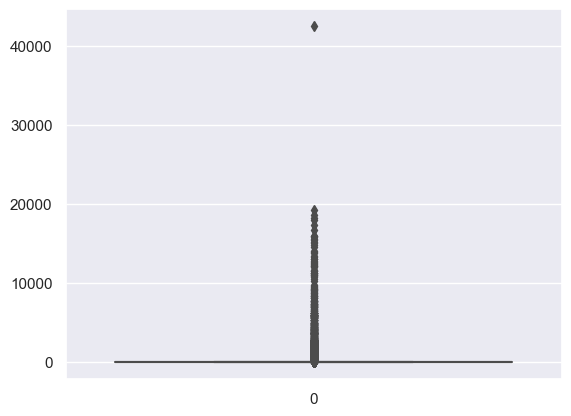

In [53]:
import seaborn as sns
sns.boxplot(corpus_tokens_count)

In [54]:
#30 most common tokens
corpus_tokens_count.head(50)

service       42553
manager       19246
people        18611
come          18241
chicken       18006
bad           17385
took          16706
eat           16016
pizza         15921
wait          15792
experience    15626
know          15403
going         15179
another       15114
two           14771
way           14528
take          14074
waitress      13954
give          13837
server        13489
customer      13356
make          13037
staff         13036
left          12785
bar           12702
first         12565
made          12388
say           12224
want          12150
rude          12102
meal          11983
cold          11638
menu          11543
great         11540
cheese        11336
last          11314
night         11313
day           11108
terrible      11025
hour          11021
horrible      10865
money         10818
location      10457
waiting       10299
sauce          9764
drink          9682
new            9520
nothing        9402
ask            9255
try            9185


##### Mots peu significatifs

##### Mots uniques

In [55]:
#30 last common tokens
corpus_tokens_count.tail(30)

40mim                                                             1
654                                                               1
632                                                               1
28520429                                                          1
stenchy                                                           1
emulsifier                                                        1
sax                                                               1
c02                                                               1
1330                                                              1
collegiate                                                        1
021                                                               1
limelight                                                         1
soundproofing                                                     1
0523                                                              1
________________________________________________

In [56]:
# définition d'une liste d'unique words --> mots présents une seule fois et pas très utiles
list_unique_words = corpus_tokens_count[corpus_tokens_count==1]
list_unique_words[:30]

syne            1
witchy          1
98mph           1
chichi          1
detestable      1
19067           1
roughing        1
penmanship      1
hacky           1
10pmish         1
6month          1
scrotum         1
kp700           1
truculent       1
boggle          1
inbreed         1
3xl             1
metronome       1
grifter         1
ghoulish        1
morass          1
127th           1
taxidermy       1
consummation    1
unsigned        1
reclinable      1
99f             1
malaria         1
camara          1
stilling        1
Name: count, dtype: int64

In [57]:
len(list_unique_words)

6000

In [58]:
# définition d'une liste d'unique words --> mots présents une seule fois et pas très utiles
list_words_10 = corpus_tokens_count[corpus_tokens_count<=10]
list_words_10[:30]

railing        10
admire         10
coverage       10
compass        10
flung          10
juke           10
320            10
goddess        10
panel          10
usage          10
muggy          10
spun           10
jenna          10
heartbeat      10
dilute         10
competency     10
chagrin        10
er             10
lowering       10
orientation    10
bien           10
illusion       10
flagship       10
thunder        10
spencer        10
fad            10
septum         10
warmly         10
kraut          10
mullet         10
Name: count, dtype: int64

In [59]:
len(list_words_10)

13591

In [60]:
len(corpus_tokens)

3392516

In [61]:
#corpus_tokens = corpus_tokens

#list_words_10 = corpus_tokens_count[corpus_tokens_count<=10]

# Éliminer les mots de 'list_words_10' de 'corpus_tokens'
corpus_tokens = [word for word in corpus_tokens if word not in list_words_10]

len(corpus_tokens)


3353611

In [62]:
#longuer de la liste de tokens uniques
len(set(corpus_tokens))

7715

In [63]:
import pandas as pd
import nltk
from nltk.tokenize import word_tokenize

# Fonction pour enlever les mots contenus dans list_words_10
def remove_words(text, words_to_remove):
    tokens = word_tokenize(text)
    cleaned_tokens = [token for token in tokens if token not in words_to_remove]
    cleaned_text = ' '.join(cleaned_tokens)
    return cleaned_text

# Appliquer la fonction pour enlever les mots de la liste list_words_10 à la colonne 'Processed_Text'
df_1['Processed_Text'] = df_1['Processed_Text'].apply(remove_words, args=(list_words_10,))



In [64]:
df_1.tail()

,Original_Text,Processed_Text,_len_txt_orig,_len_txt_proc
99995,Woah Stepped into this McDonalds looking for b...,stepped looking breakfast one unpleasant chain...,546,221
99996,Homemade chips were a mixture of fresh and yes...,homemade chip mixture fresh yesterday latter u...,355,126
99997,What s the point of setting a pick up time for...,point setting pick time order end waiting 30mi...,372,147
99998,Very slow service An excellent place for your ...,slow service excellent place last meal quick l...,174,106
99999,I haven t been to this restaurant in about 6 m...,restaurant told manager going tell people expe...,1476,605


In [65]:
#Vérification
word_to_search = "sickness"

# Utiliser str.contains pour filtrer les lignes contenant le mot recherché
result = df_1[df_1['Processed_Text'].str.contains(word_to_search)]

# Afficher le résultat
print(result)


                                           Original_Text                                     Processed_Text  _len_txt_orig  _len_txt_proc
1747   Got the burger and it wasn t that great Food w...  got great food ordered well done came medium r...            519            217
2006   Our daughter wanted sushi for her 18th birthda...  daughter 18th birthday went usual place want g...           3206           1185
5547   Update to below s review Next day Yep My stoma...  update review next day yep stomach upset get s...           1303            583
10597  I got food poisoning from here yesterday I got...  got food poisoning yesterday got chicken clear...            689            321
17190  Do Not buy from here if you aren t familiar wi...  buy familiar people lady assuming wife two peo...           1057            434
21649  I got food poisoning from this restaurant I or...  got food poisoning restaurant ordered turkey a...            389            212
23807  Ate lunch here today this r

In [66]:
#Drop de la phrase en alphabeth non-occidental  et insulte

# Import de Pandas
import pandas as pd

# Identification des lignes contenant le mot d'insulte
rows_to_drop = df_1['Original_Text'].str.contains('bitch', case=False)

# Suppression des lignes correspondantes du DataFrame
df_1 = df_1[~rows_to_drop]


In [67]:
import random

# Calculer la taille de l'échantillon (20% de la taille originale)
sample_size = int(0.2 * len(corpus_tokens))

# Échantillonner 20% des tokens de la liste
sampled_tokens = random.sample(corpus_tokens, sample_size)

# Afficher le résultat
#print(sampled_tokens)


IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



### Associer chaque mot du corpus à un identifiant clé unique

In [68]:
import nltk
import gensim
from gensim import corpora

# Tokenize chaque document dans la colonne 'Processed_Text'
corpus_tokens = df_1['Processed_Text'].apply(nltk.word_tokenize)

# Créer un dictionnaire
dictionary = corpora.Dictionary(corpus_tokens)
print(dictionary)

2023-12-08 16:22:57,073 : INFO : adding document #0 to Dictionary<0 unique tokens: []>
2023-12-08 16:22:57,340 : INFO : adding document #10000 to Dictionary<7153 unique tokens: ['average', 'cold', 'food', 'greasy', 'interior']...>
2023-12-08 16:22:57,613 : INFO : adding document #20000 to Dictionary<7605 unique tokens: ['average', 'cold', 'food', 'greasy', 'interior']...>
2023-12-08 16:22:57,892 : INFO : adding document #30000 to Dictionary<7710 unique tokens: ['average', 'cold', 'food', 'greasy', 'interior']...>
2023-12-08 16:22:58,180 : INFO : adding document #40000 to Dictionary<7729 unique tokens: ['average', 'cold', 'food', 'greasy', 'interior']...>
2023-12-08 16:22:58,485 : INFO : adding document #50000 to Dictionary<7731 unique tokens: ['average', 'cold', 'food', 'greasy', 'interior']...>
2023-12-08 16:22:58,763 : INFO : adding document #60000 to Dictionary<7732 unique tokens: ['average', 'cold', 'food', 'greasy', 'interior']...>
2023-12-08 16:22:59,038 : INFO : adding document 

Dictionary<7732 unique tokens: ['average', 'cold', 'food', 'greasy', 'interior']...>


Le dictionnaire a été construit ici avec un total de 3940 termes uniques extraits des 19937 documents du corpus.

### Bigrammes, trigrammes et Ngrammes

#### Utilisation du module Phrases de Gesim pour anlayser les bigrammes et les trigrammes

In [69]:
from gensim.models import Phrases
from gensim.models.phrases import Phraser

nltk.download('punkt')

# Tokenize chaque document dans la colonne 'Processed_Text'
corpus_tokens = df_1['Processed_Text'].apply(nltk.word_tokenize).tolist()

# Calculer le nombre total de bigrams possibles dans le corpus
#total_bigrams = sum(len(tokens) - 1 for tokens in corpus_tokens)

# Définir un pourcentage minimum d'apparition des bigrams
#percentage_threshold = 0.80

# Calculer le seuil en fonction du pourcentage
#threshold = total_bigrams * percentage_threshold

# Créer un modèle Phrases avec le seuil
#bigram = Phrases(corpus_tokens, min_count=10, threshold=threshold)

# Créer un Phraser pour accélérer la recherche des bigrams
#bigram_phraser = Phraser(bigram)

# Appliquer le Phraser pour obtenir les textes avec les bigrams
#text_with_bigrams = [bigram_phraser[tokens] for tokens in corpus_tokens]

# Afficher les textes avec les bigrams
#for text in text_with_bigrams:
    #print(" ".join(text))


[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\andre\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
2023-12-08 16:23:11,349 : INFO : collecting all words and their counts
2023-12-08 16:23:11,350 : INFO : PROGRESS: at sentence #0, processed 0 words and 0 word types
2023-12-08 16:23:11,627 : INFO : PROGRESS: at sentence #10000, processed 396863 words and 221072 word types
2023-12-08 16:23:11,916 : INFO : PROGRESS: at sentence #20000, processed 789915 words and 367696 word types
2023-12-08 16:23:12,214 : INFO : PROGRESS: at sentence #30000, processed 1186166 words and 492456 word types
2023-12-08 16:23:12,532 : INFO : PROGRESS: at sentence #40000, processed 1593820 words and 606003 word types
2023-12-08 16:23:12,876 : INFO : PROGRESS: at sentence #50000, processed 1995141 words and 707971 word types
2023-12-08 16:23:13,193 : INFO : PROGRESS: at sentence #60000, processed 2393122 words and 801572 word types
2023-12-08 16:23:13,514 : INFO 

In [70]:
from nltk.util import bigrams, trigrams, ngrams

# tokeniser le corpus pour en extraire les bigrammes
corpus_tokens = nltk.word_tokenize(raw_corpus)

# Créer les bigrammes
corpus_bigrams = list(nltk.bigrams(corpus_tokens))

# affichage
corpus_bigrams

[('food', 'average'),
 ('average', 'greasy'),
 ('greasy', 'price'),
 ('price', 'three'),
 ('three', 'interior'),
 ('interior', 'cold'),
 ('cold', 'inviting'),
 ('inviting', 'would'),
 ('would', 'recommendgator'),
 ('recommendgator', 'plate'),
 ('plate', 'thing'),
 ('thing', 'gator'),
 ('gator', 'rip'),
 ('rip', 'coming'),
 ('coming', 'gumbo'),
 ('gumbo', 'nastylike'),
 ('nastylike', 'staff'),
 ('staff', 'behind'),
 ('behind', 'counter'),
 ('counter', 'food'),
 ('food', 'used'),
 ('used', 'time'),
 ('time', 'last'),
 ('last', 'time'),
 ('time', 'went'),
 ('went', 'terrible'),
 ('terrible', 'experience'),
 ('experience', 'man'),
 ('man', 'assume'),
 ('assume', 'owner'),
 ('owner', 'brown'),
 ('brown', 'hair'),
 ('hair', 'tall'),
 ('tall', 'gave'),
 ('gave', 'time'),
 ('time', 'told'),
 ('told', 'blocking'),
 ('blocking', 'way'),
 ('way', 'rude'),
 ('rude', 'disrespectful'),
 ('disrespectful', 'told'),
 ('told', 'blocking'),
 ('blocking', 'anything'),
 ('anything', 'hear'),
 ('hear', 'wen

In [71]:
import nltk
from nltk.util import bigrams
from nltk import FreqDist

# Tokeniser le corpus pour extraire les bigrammes
corpus_tokens = nltk.word_tokenize(raw_corpus)

# Créer les bigrammes
corpus_bigrams = list(bigrams(corpus_tokens))

# Calculer la fréquence des bigrammes
freq_dist = FreqDist(corpus_bigrams)

# Obtenir les 10 bigrammes les plus fréquents
top_50_bigrams = freq_dist.most_common(50)

# Afficher les 10 bigrammes les plus fréquents
print("Les 50 bigrammes les plus fréquents sont :")
for bigram, frequency in top_50_bigrams:
    print(bigram, ":", frequency)


Les 50 bigrammes les plus fréquents sont :
('customer', 'service') : 6625
('tasted', 'like') : 3954
('first', 'time') : 3606
('food', 'good') : 3013
('last', 'time') : 2523
('get', 'food') : 2471
('said', 'would') : 2043
('last', 'night') : 1950
('food', 'service') : 1948
('one', 'star') : 1894
('would', 'recommend') : 1891
('food', 'came') : 1837
('take', 'order') : 1765
('got', 'food') : 1751
('every', 'time') : 1727
('told', 'would') : 1669
('long', 'time') : 1651
('service', 'food') : 1634
('good', 'food') : 1587
('waste', 'time') : 1495
('needle', 'say') : 1485
('food', 'cold') : 1433
('wait', 'staff') : 1409
('order', 'food') : 1407
('took', 'order') : 1403
('let', 'know') : 1377
('took', 'get') : 1323
('credit', 'card') : 1320
('make', 'sure') : 1314
('several', 'time') : 1310
('service', 'slow') : 1295
('quality', 'food') : 1280
('service', 'terrible') : 1239
('drink', 'order') : 1238
('could', 'get') : 1234
('place', 'order') : 1229
('second', 'time') : 1200
('would', 'like') 

In [72]:
import nltk
from nltk.util import bigrams
from nltk import FreqDist

# Tokeniser le corpus pour extraire les bigrammes
corpus_tokens = nltk.word_tokenize(raw_corpus)

# Créer les bigrammes
corpus_bigrams = list(bigrams(corpus_tokens))

# Calculer la fréquence des bigrammes
freq_dist = FreqDist(corpus_bigrams)

# Calculer le nombre total de bigrammes
total_bigrams = len(corpus_bigrams)

# Calculer le pourcentage d'occurrence pour chaque bigramme
bigram_percentage = [(bigram, frequency / total_bigrams * 100) for bigram, frequency in freq_dist.items()]

# Trier les bigrammes par pourcentage décroissant
sorted_bigrams = sorted(bigram_percentage, key=lambda x: x[1], reverse=True)

# Obtenir les 10 bigrammes les plus fréquents
top_10_bigrams = sorted_bigrams[:10]

# Afficher les 10 bigrammes les plus fréquents avec leur pourcentage
print("Les 10 bigrammes les plus fréquents avec leur pourcentage sont :")
for bigram, percentage in top_10_bigrams:
    print(f"{bigram} : {percentage:.2f}%")


Les 10 bigrammes les plus fréquents avec leur pourcentage sont :
('customer', 'service') : 0.17%
('tasted', 'like') : 0.10%
('first', 'time') : 0.09%
('food', 'good') : 0.08%
('last', 'time') : 0.06%
('get', 'food') : 0.06%
('said', 'would') : 0.05%
('last', 'night') : 0.05%
('food', 'service') : 0.05%
('one', 'star') : 0.05%


In [73]:
! pip install gensim

In [74]:
!pip install --upgrade gensim


In [75]:
! pip install scipy

In [76]:
#import gensim, spacy, logging, warnings
import gensim.corpora as corpora
from gensim.utils import simple_preprocess
from gensim.models import CoherenceModel
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore")

In [77]:
# Build the bigram and trigram models
bigram = gensim.models.Phrases(df_1['Processed_Text'], min_count=5, threshold=100) # higher threshold fewer phrases.
trigram = gensim.models.Phrases(bigram[(df_1['Processed_Text'])], threshold=100)

# Faster way to get a sentence clubbed as a trigram/bigram
bigram_mod = gensim.models.phrases.Phraser(bigram)
trigram_mod = gensim.models.phrases.Phraser(trigram)

2023-12-08 16:23:51,672 : INFO : collecting all words and their counts
2023-12-08 16:23:51,673 : INFO : PROGRESS: at sentence #0, processed 0 words and 0 word types
2023-12-08 16:23:53,106 : INFO : PROGRESS: at sentence #10000, processed 2517718 words and 673 word types
2023-12-08 16:23:54,651 : INFO : PROGRESS: at sentence #20000, processed 5009925 words and 682 word types
2023-12-08 16:23:56,141 : INFO : PROGRESS: at sentence #30000, processed 7525364 words and 686 word types
2023-12-08 16:23:57,698 : INFO : PROGRESS: at sentence #40000, processed 10110466 words and 686 word types
2023-12-08 16:23:59,211 : INFO : PROGRESS: at sentence #50000, processed 12661733 words and 686 word types
2023-12-08 16:24:00,733 : INFO : PROGRESS: at sentence #60000, processed 15187912 words and 686 word types
2023-12-08 16:24:02,279 : INFO : PROGRESS: at sentence #70000, processed 17733380 words and 686 word types
2023-12-08 16:24:03,839 : INFO : PROGRESS: at sentence #80000, processed 20284195 words a

In [78]:
df_1.head()

,Original_Text,Processed_Text,_len_txt_orig,_len_txt_proc
0,The food is just average and very overpriced a...,food average greasy price three interior cold ...,179,70
1,I paid 20 for the gator plate which was the sa...,gator plate thing gator rip coming gumbo nasty,155,46
2,I really like the staff behind the counter and...,like staff behind counter food used time last ...,896,383
3,This is not Chinese food It s like aliens land...,food like landed earth found menu lying ground...,1033,432
4,Definitely not like it used to be I ordered th...,like used ordered whiskey river onion onion bu...,357,126


##### Pondération des bigrammes

In [79]:
import nltk
from nltk.util import bigrams
from nltk import FreqDist

# Tokeniser le corpus pour extraire les bigrammes
corpus_tokens = nltk.word_tokenize(raw_corpus)

# Créer les bigrammes
corpus_bigrams = list(bigrams(corpus_tokens))

# Calculer la fréquence des bigrammes
freq_dist = FreqDist(corpus_bigrams)

# Obtenir le nombre total de bigrammes
total_bigrams = len(corpus_bigrams)

# Créer un dictionnaire pour stocker les bigrammes pondérés
weighted_bigrams = {}

# Calculer la fréquence relative de chaque bigramme
for bigram, frequency in freq_dist.items():
    weighted_bigrams[bigram] = frequency / total_bigrams

# Afficher les bigrammes pondérés
for bigram, weight in weighted_bigrams.items():
    print(bigram, ":", weight)


('food', 'average') : 0.00010520159794889839
('average', 'greasy') : 1.520986958297326e-06
('greasy', 'price') : 5.069956527657754e-07
('price', 'three') : 1.0139913055315507e-06
('three', 'interior') : 2.534978263828877e-07
('interior', 'cold') : 2.534978263828877e-07
('cold', 'inviting') : 2.534978263828877e-07
('inviting', 'would') : 5.069956527657754e-07
('would', 'recommendgator') : 2.534978263828877e-07
('recommendgator', 'plate') : 2.534978263828877e-07
('plate', 'thing') : 2.7884760902117645e-06
('thing', 'gator') : 2.534978263828877e-07
('gator', 'rip') : 2.534978263828877e-07
('rip', 'coming') : 7.60493479148663e-07
('coming', 'gumbo') : 2.534978263828877e-07
('gumbo', 'nastylike') : 2.534978263828877e-07
('nastylike', 'staff') : 2.534978263828877e-07
('staff', 'behind') : 9.379419576166845e-06
('behind', 'counter') : 0.00026972168727139247
('counter', 'food') : 1.1407402187229946e-05
('food', 'used') : 3.067323699232941e-05
('used', 'time') : 7.858432617869518e-06
('time', '

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



5.069956527657754e-07
('mass', 'tourism') : 2.534978263828877e-07
('tourism', 'tourist') : 2.534978263828877e-07
('trap', 'reference') : 2.534978263828877e-07
('reference', 'visitinguncooked') : 2.534978263828877e-07
('visitinguncooked', 'meat') : 2.534978263828877e-07
('zero', 'terrible') : 1.2674891319144383e-06
('tip', 'apology') : 2.534978263828877e-07
('raw', 'get') : 1.7744847846802138e-06
('work', 'bitten') : 2.534978263828877e-07
('bitten', 'fired') : 2.534978263828877e-07
('grill', 'come') : 7.60493479148663e-07
('come', 'mooing') : 2.534978263828877e-07
('mooing', 'would') : 2.534978263828877e-07
('excusable', 'buck') : 2.534978263828877e-07
('could', 'though') : 1.2674891319144383e-06
('wrong', 'fifteen') : 2.534978263828877e-07
('fifteen', 'kitchen') : 2.534978263828877e-07
('kitchen', 'address') : 2.534978263828877e-07
('address', 'inedible') : 2.534978263828877e-07
('inedible', 'safety') : 2.534978263828877e-07
('hazard', 'mistake') : 2.534978263828877e-07
('paying', 'une

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



2.534978263828877e-07
('spouse', 'fellow') : 2.534978263828877e-07
('fellow', 'critic') : 2.534978263828877e-07
('critic', 'experienced') : 2.534978263828877e-07
('tuna', 'discernible') : 2.534978263828877e-07
('rice', 'bite') : 2.534978263828877e-07
('bite', 'mush') : 2.534978263828877e-07
('mush', 'tell') : 2.534978263828877e-07
('take', 'hardwent') : 2.534978263828877e-07
('hardwent', 'last') : 2.534978263828877e-07
('going', 'sort') : 2.534978263828877e-07
('sort', 'big') : 2.534978263828877e-07
('people', 'glaring') : 2.534978263828877e-07
('sitting', 'kept') : 2.534978263828877e-07
('pushing', 'chair') : 5.069956527657754e-07
('chair', 'sighing') : 2.534978263828877e-07
('sighing', 'though') : 2.534978263828877e-07
('dried', 'vomit') : 2.534978263828877e-07
('bathroom', 'unpleasant') : 2.534978263828877e-07
('worth', 'serviceattention') : 2.534978263828877e-07
('serviceattention', 'place') : 2.534978263828877e-07
('place', 'dress') : 5.069956527657754e-07
('flip', 'good') : 2.534

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



In [80]:
# Création d'un bag of bigrams
corpus_bigrams = list(bigrams(corpus_tokens))

# Créer un dictionnaire de bigrammes et leurs fréquences
bigram_freq = FreqDist(corpus_bigrams)

# Afficher les 50 premiers bigrammes
for bigram, freq in bigram_freq.most_common(50):
    print(bigram, ":", freq)

('customer', 'service') : 6625
('tasted', 'like') : 3954
('first', 'time') : 3606
('food', 'good') : 3013
('last', 'time') : 2523
('get', 'food') : 2471
('said', 'would') : 2043
('last', 'night') : 1950
('food', 'service') : 1948
('one', 'star') : 1894
('would', 'recommend') : 1891
('food', 'came') : 1837
('take', 'order') : 1765
('got', 'food') : 1751
('every', 'time') : 1727
('told', 'would') : 1669
('long', 'time') : 1651
('service', 'food') : 1634
('good', 'food') : 1587
('waste', 'time') : 1495
('needle', 'say') : 1485
('food', 'cold') : 1433
('wait', 'staff') : 1409
('order', 'food') : 1407
('took', 'order') : 1403
('let', 'know') : 1377
('took', 'get') : 1323
('credit', 'card') : 1320
('make', 'sure') : 1314
('several', 'time') : 1310
('service', 'slow') : 1295
('quality', 'food') : 1280
('service', 'terrible') : 1239
('drink', 'order') : 1238
('could', 'get') : 1234
('place', 'order') : 1229
('second', 'time') : 1200
('would', 'like') : 1194
('ordered', 'food') : 1186
('service

In [81]:
from nltk.util import bigrams, trigrams, ngrams

# tokeniser le corpus pour en extraire les bigrammes
corpus_tokens = nltk.word_tokenize(raw_corpus)

# Créer les bigrammes
corpus_trigrams = list(nltk.trigrams(corpus_tokens))

# affichage
corpus_trigrams

[('food', 'average', 'greasy'),
 ('average', 'greasy', 'price'),
 ('greasy', 'price', 'three'),
 ('price', 'three', 'interior'),
 ('three', 'interior', 'cold'),
 ('interior', 'cold', 'inviting'),
 ('cold', 'inviting', 'would'),
 ('inviting', 'would', 'recommendgator'),
 ('would', 'recommendgator', 'plate'),
 ('recommendgator', 'plate', 'thing'),
 ('plate', 'thing', 'gator'),
 ('thing', 'gator', 'rip'),
 ('gator', 'rip', 'coming'),
 ('rip', 'coming', 'gumbo'),
 ('coming', 'gumbo', 'nastylike'),
 ('gumbo', 'nastylike', 'staff'),
 ('nastylike', 'staff', 'behind'),
 ('staff', 'behind', 'counter'),
 ('behind', 'counter', 'food'),
 ('counter', 'food', 'used'),
 ('food', 'used', 'time'),
 ('used', 'time', 'last'),
 ('time', 'last', 'time'),
 ('last', 'time', 'went'),
 ('time', 'went', 'terrible'),
 ('went', 'terrible', 'experience'),
 ('terrible', 'experience', 'man'),
 ('experience', 'man', 'assume'),
 ('man', 'assume', 'owner'),
 ('assume', 'owner', 'brown'),
 ('owner', 'brown', 'hair'),
 (

In [82]:
import nltk
from nltk.util import bigrams
from nltk import FreqDist

# Tokeniser le corpus pour extraire les bigrammes
corpus_tokens = nltk.word_tokenize(raw_corpus)

# Créer les bigrammes
corpus_trigrams = list(trigrams(corpus_tokens))

# Calculer la fréquence des bigrammes
freq_dist_tr = FreqDist(corpus_trigrams)

# Obtenir les 20 trigrammes les plus fréquents
top_20_trigrams = freq_dist_tr.most_common(20)

# Afficher les 50 trigrammes les plus fréquents
print("Les 20 trigrammes les plus fréquents sont :")
for trigram, frequency in top_20_trigrams:
    print(trigram, ":", frequency)

Les 20 trigrammes les plus fréquents sont :
('poor', 'customer', 'service') : 415
('would', 'recommend', 'place') : 394
('waste', 'time', 'money') : 380
('horrible', 'customer', 'service') : 301
('food', 'good', 'service') : 300
('terrible', 'customer', 'service') : 286
('took', 'long', 'time') : 285
('take', 'drink', 'order') : 276
('every', 'single', 'time') : 270
('took', 'drink', 'order') : 256
('took', 'hour', 'get') : 254
('got', 'order', 'wrong') : 252
('give', 'zero', 'would') : 252
('good', 'customer', 'service') : 245
('recommend', 'place', 'anyone') : 244
('give', 'one', 'star') : 228
('got', 'food', 'poisoning') : 226
('took', 'get', 'food') : 226
('give', 'another', 'chance') : 213
('bad', 'customer', 'service') : 207


In [83]:
from nltk.util import bigrams, trigrams, ngrams

# tokeniser le corpus pour en extraire les bigrammes
corpus_tokens = nltk.word_tokenize(raw_corpus)

# Créer les bigrammes
corpus_ngrams = list(nltk.ngrams(corpus_tokens, 5))

# affichage
corpus_ngrams

[('food', 'average', 'greasy', 'price', 'three'),
 ('average', 'greasy', 'price', 'three', 'interior'),
 ('greasy', 'price', 'three', 'interior', 'cold'),
 ('price', 'three', 'interior', 'cold', 'inviting'),
 ('three', 'interior', 'cold', 'inviting', 'would'),
 ('interior', 'cold', 'inviting', 'would', 'recommendgator'),
 ('cold', 'inviting', 'would', 'recommendgator', 'plate'),
 ('inviting', 'would', 'recommendgator', 'plate', 'thing'),
 ('would', 'recommendgator', 'plate', 'thing', 'gator'),
 ('recommendgator', 'plate', 'thing', 'gator', 'rip'),
 ('plate', 'thing', 'gator', 'rip', 'coming'),
 ('thing', 'gator', 'rip', 'coming', 'gumbo'),
 ('gator', 'rip', 'coming', 'gumbo', 'nastylike'),
 ('rip', 'coming', 'gumbo', 'nastylike', 'staff'),
 ('coming', 'gumbo', 'nastylike', 'staff', 'behind'),
 ('gumbo', 'nastylike', 'staff', 'behind', 'counter'),
 ('nastylike', 'staff', 'behind', 'counter', 'food'),
 ('staff', 'behind', 'counter', 'food', 'used'),
 ('behind', 'counter', 'food', 'used',

In [84]:
import nltk
from nltk.util import bigrams
from nltk import FreqDist

# Tokeniser le corpus pour extraire les bigrammes
corpus_tokens = nltk.word_tokenize(raw_corpus)

# Créer les bigrammes
corpus_ngrams = list(nltk.ngrams(corpus_tokens, 5))

# Calculer la fréquence des bigrammes
freq_dist_tr = FreqDist(corpus_ngrams)

# Obtenir les 10 trigrammes les plus fréquents
top_10_ngrams = freq_dist_tr.most_common(10)

# Afficher les 10 ngrammes les plus fréquents
print("Les 10 ngrammes les plus fréquents sont :")
for ngram, frequency in top_10_ngrams:
    print(ngram, ":", frequency)

Les 10 ngrammes les plus fréquents sont :
('rude', 'rude', 'rude', 'rude', 'rude') : 37
('food', 'took', 'long', 'time', 'come') : 21
('buy', 'one', 'get', 'one', 'free') : 19
('took', 'long', 'time', 'get', 'food') : 18
('thought', 'would', 'give', 'another', 'try') : 16
('must', 'try', 'pastor', 'must', 'try') : 16
('try', 'pastor', 'must', 'try', 'pastor') : 16
('took', 'hour', 'half', 'get', 'food') : 15
('pastor', 'must', 'try', 'pastor', 'must') : 15
('customer', 'service', 'go', 'long', 'way') : 14


### **Traîtement du corpus**

#### Vectorisation avec One-Hot Encoding

In [85]:
import sklearn
from sklearn.feature_extraction.text import CountVectorizer

# Créer un vectoriseur de comptage (CountVectorizer)
vectorizer = CountVectorizer(decode_error='ignore', stop_words='english', lowercase=True,)

# Appliquer le vectoriseur sur le corpus prétraité
corpus_vectorized = vectorizer.fit_transform(df_1['Processed_Text'])
#corpus_vectorized = vectorizer.fit_transform(corpus_tokens)

# Obtenir les noms des caractéristiques (mots)
feature_names = vectorizer.get_feature_names_out()

# Affichez l'ensemble du vocabulaire
print("Ensemble du vocabulaire :", feature_names)

# Affichez la matrice vocabulaire-documents
print("\nMatrice vocabulaire-documents :\n", corpus_vectorized.toarray())


Ensemble du vocabulaire : ['000' '00am' '00p' ... 'zone' 'zoo' 'zucchini']

Matrice vocabulaire-documents :
 [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


In [86]:
import sklearn
from sklearn.feature_extraction.text import CountVectorizer

# Créer un vectoriseur de comptage (CountVectorizer)
vectorizer = CountVectorizer(decode_error='ignore', stop_words='english', lowercase=True,)

# Appliquer le vectoriseur sur le corpus prétraité
corpus_vectorized_1 = vectorizer.fit_transform(df_1['Processed_Text'])
corpus_vectorized_1

<99719x7582 sparse matrix of type '<class 'numpy.int64'>'
	with 2847459 stored elements in Compressed Sparse Row format>

### Tranformation de la matrice creuse en matrice dense

In [87]:
# Transformation matrice creuse en matrice dense
corpus_vectorized_dense = corpus_vectorized_1.todense()

#### Obtention des noms des caractéristiques (mots)

In [88]:
# Obtenir les noms des caractéristiques (mots)
feature_names = vectorizer.get_feature_names_out()

In [89]:
# voir les 20 premiers
feature_names[:20]

array(['000', '00am', '00p', '00pm', '02pm', '05pm', '100', '1000',
       '100x', '101', '102', '1030', '105', '109', '10am', '10min',
       '10mins', '10minutes', '10oz', '10p'], dtype=object)

In [90]:
# voir les 20 derniers
feature_names[-20:]

array(['yesterday', 'yoga', 'yolk', 'york', 'yorker', 'young', 'youth',
       'yuca', 'yucca', 'yuck', 'yucky', 'yummy', 'zero', 'zesty', 'zing',
       'zip', 'zombie', 'zone', 'zoo', 'zucchini'], dtype=object)

#### Bag of words : TF-IDF. Term Frequency-Inverse Document Frequency

Ce calcul évalue l’importance d’un terme contenu dans un document, relativement à une collection. Si un mot rare est particulièrement présent dans un document, son TF-IDF sera très élevé.
TF(t,i) = Nombre d’apparitions du terme t dans le document i / Nombre total de termes dans le document

IDF(t) = log(Nombre de documents dans le corpus / Nombre de documents où t apparaît)

D’où TF(t,i) * IDF(t) donne la pertinence de chaque document vis-à-vis d’un mot.


In [91]:
import sklearn
from sklearn.feature_extraction.text import TfidfVectorizer

# Créer une instance du vectoriseur TfidfVectorizer
vectorizer_Tf = TfidfVectorizer(decode_error='ignore', stop_words='english')

# Appliquer le vectoriseur sur la colonne 'Processed_Text'
corpus_vectorised = vectorizer_Tf.fit_transform(df_1['Processed_Text'])

# Convertir les caractéristiques (corpus_vectorised ici) en une représentation de matrice creuse
corpus_vectorised = corpus_vectorised.toarray()

# Afficher les dimensions de la matrice de caractéristiques
print("Dimensions de la matrice de caractéristiques :", corpus_vectorised.shape)

# Afficher l'ensemble du vocabulaire
print("Ensemble du vocabulaire :", vectorizer_Tf.get_feature_names_out())

# Afficher la matrice TF-IDF
print("\nMatrice TF-IDF \n", corpus_vectorised)


Dimensions de la matrice de caractéristiques : (99719, 7582)
Ensemble du vocabulaire : ['000' '00am' '00p' ... 'zone' 'zoo' 'zucchini']

Matrice TF-IDF 
 [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


#### Processus detaillé

In [92]:
import sklearn
from sklearn.feature_extraction.text import TfidfVectorizer

# Créer une instance du vectoriseur TfidfVectorizer
vectorizer_Tf = TfidfVectorizer(decode_error='ignore', stop_words='english')

# Appliquer le vectoriseur sur la colonne 'Processed_Text'
corpus_vectorised = vectorizer_Tf.fit_transform(df_1['Processed_Text'])
corpus_vectorised

<99719x7582 sparse matrix of type '<class 'numpy.float64'>'
	with 2847459 stored elements in Compressed Sparse Row format>

#### Transformation de la matrice éparse en matrice dense

In [93]:
corpus_vectorised_d = corpus_vectorised.todense()
corpus_vectorised_d

matrix([[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.]])

In [94]:
# Obtenir les noms des caractéristiques (mots)
feature_names_Tf = vectorizer_Tf.get_feature_names_out()

In [95]:
# voir les 20 premiers
feature_names_Tf[:20]

array(['000', '00am', '00p', '00pm', '02pm', '05pm', '100', '1000',
       '100x', '101', '102', '1030', '105', '109', '10am', '10min',
       '10mins', '10minutes', '10oz', '10p'], dtype=object)

In [96]:
# voir les 20 derniers
feature_names_Tf[-20:]

array(['yesterday', 'yoga', 'yolk', 'york', 'yorker', 'young', 'youth',
       'yuca', 'yucca', 'yuck', 'yucky', 'yummy', 'zero', 'zesty', 'zing',
       'zip', 'zombie', 'zone', 'zoo', 'zucchini'], dtype=object)

In [97]:
import gensim.downloader as api
from gensim.models import TfidfModel
from gensim.corpora import Dictionary

dataset = api.load("text8")
dct = Dictionary(dataset)  # fit dictionary
corpus = [dct.doc2bow(line) for line in dataset]  # convert corpus to BoW format

model = TfidfModel(corpus)  # fit model
vector = model[corpus[0]]  # apply model to the first corpus document

2023-12-08 16:25:36,223 : INFO : adding document #0 to Dictionary<0 unique tokens: []>
2023-12-08 16:25:45,158 : INFO : built Dictionary<253854 unique tokens: ['a', 'abacus', 'abilities', 'ability', 'able']...> from 1701 documents (total 17005207 corpus positions)
2023-12-08 16:25:45,160 : INFO : Dictionary lifecycle event {'msg': "built Dictionary<253854 unique tokens: ['a', 'abacus', 'abilities', 'ability', 'able']...> from 1701 documents (total 17005207 corpus positions)", 'datetime': '2023-12-08T16:25:45.160963', 'gensim': '4.3.2', 'python': '3.10.13 | packaged by Anaconda, Inc. | (main, Sep 11 2023, 13:15:57) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'created'}
2023-12-08 16:25:50,720 : INFO : collecting document frequencies
2023-12-08 16:25:50,721 : INFO : PROGRESS: processing document #0
2023-12-08 16:25:51,446 : INFO : TfidfModel lifecycle event {'msg': 'calculated IDF weights for 1701 documents and 253854 features (4318888 matrix non-zeros

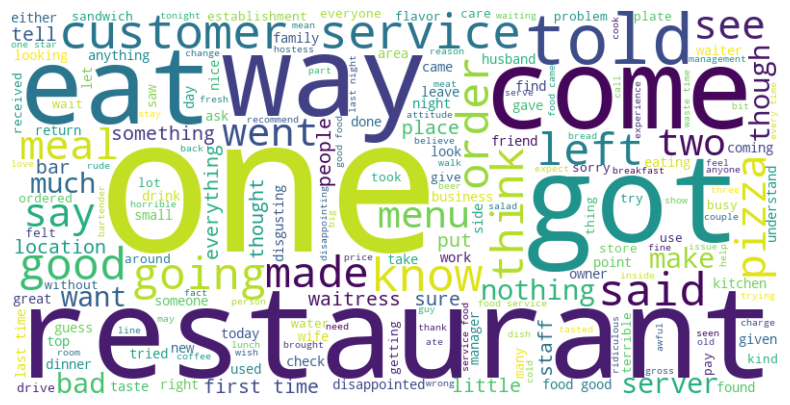

In [98]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Concaténer tous les textes de la colonne 'Processed_text' en une seule chaîne
all_processed_text = ' '.join(df_1['Processed_Text'])

# Créer un objet WordCloud
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(all_processed_text)

# Afficher le nuage de mots
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()


## LDA

#### Conversion des données

#### Appel d'un dictionnaire à partir des données préparées

In [99]:
import nltk
from nltk.tokenize import word_tokenize

import gensim
from gensim.utils import simple_preprocess
from gensim.parsing.preprocessing import STOPWORDS
from gensim.models import CoherenceModel

In [100]:
# Tokenize chaque document dans la colonne 'Processed_Text'
corpus_tokens = df_1['Processed_Text'].apply(nltk.word_tokenize)

# Créer un dictionnaire
dictionary = gensim.corpora.Dictionary(corpus_tokens)
print(dictionary)

2023-12-08 16:26:14,543 : INFO : adding document #0 to Dictionary<0 unique tokens: []>
2023-12-08 16:26:14,799 : INFO : adding document #10000 to Dictionary<7153 unique tokens: ['average', 'cold', 'food', 'greasy', 'interior']...>
2023-12-08 16:26:15,053 : INFO : adding document #20000 to Dictionary<7605 unique tokens: ['average', 'cold', 'food', 'greasy', 'interior']...>
2023-12-08 16:26:15,307 : INFO : adding document #30000 to Dictionary<7710 unique tokens: ['average', 'cold', 'food', 'greasy', 'interior']...>
2023-12-08 16:26:15,600 : INFO : adding document #40000 to Dictionary<7729 unique tokens: ['average', 'cold', 'food', 'greasy', 'interior']...>
2023-12-08 16:26:15,896 : INFO : adding document #50000 to Dictionary<7731 unique tokens: ['average', 'cold', 'food', 'greasy', 'interior']...>
2023-12-08 16:26:16,182 : INFO : adding document #60000 to Dictionary<7732 unique tokens: ['average', 'cold', 'food', 'greasy', 'interior']...>
2023-12-08 16:26:16,479 : INFO : adding document 

Dictionary<7732 unique tokens: ['average', 'cold', 'food', 'greasy', 'interior']...>


##### Filtrage du dictionnaire

In [101]:
dictionary.filter_extremes(no_below=15, no_above=0.1, keep_n=1000)

2023-12-08 16:26:17,500 : INFO : discarding 6732 tokens: [('food', 49302), ('interior', 288), ('inviting', 135), ('would', 25999), ('gator', 41), ('gumbo', 418), ('blocking', 75), ('customer', 10514), ('experience', 12703), ('get', 26432)]...
2023-12-08 16:26:17,501 : INFO : keeping 1000 tokens which were in no less than 15 and no more than 9971 (=10.0%) documents
2023-12-08 16:26:17,502 : INFO : resulting dictionary: Dictionary<1000 unique tokens: ['average', 'cold', 'greasy', 'price', 'recommend']...>


Nous avons filtré le dictionnaire pour ne garder que les mots pouvant apparaitre dans un total d'entre 99 et 15 documents.

##### Transformation en format Bag OF Words (bow)

In [102]:
bow_corpus = [dictionary.doc2bow(doc) for doc in corpus_tokens]

In [103]:
# Imprimer le nombre de documents dans bow_corpus
print("Nombre de documents dans bow_corpus :", len(bow_corpus))

Nombre de documents dans bow_corpus : 99719


#### Exécution du LDA

On applique le topic modeling à l’aide de la fonction LdaMulticore de gensim en prenant bien soin de préciser le nombre de topic à extraire du corpus, le mapping entre les identifiants des mots (entiers) et les mots (chaîne de caractères) et le nombre à effectuer d’itération dans le corpus.

Le nombre de topic à extraire constitue une variable importante du modèle, son choix est souvent cruciale tout comme celui du nombres de classes en clustering par exemple.


In [104]:
from gensim import corpora
from gensim.models import LdaMulticore

#Création du model LDA
lda_model = gensim.models.LdaMulticore(bow_corpus, num_topics = 4, id2word = dictionary, passes = 100)


2023-12-08 16:26:21,322 : INFO : using symmetric alpha at 0.25
2023-12-08 16:26:21,323 : INFO : using symmetric eta at 0.25
2023-12-08 16:26:21,324 : INFO : using serial LDA version on this node
2023-12-08 16:26:21,326 : INFO : running online LDA training, 4 topics, 100 passes over the supplied corpus of 99719 documents, updating every 38000 documents, evaluating every ~99719 documents, iterating 50x with a convergence threshold of 0.001000
2023-12-08 16:26:21,328 : INFO : training LDA model using 19 processes
2023-12-08 16:26:23,190 : INFO : PROGRESS: pass 0, dispatched chunk #0 = documents up to #2000/99719, outstanding queue size 1
2023-12-08 16:26:23,204 : INFO : PROGRESS: pass 0, dispatched chunk #1 = documents up to #4000/99719, outstanding queue size 2
2023-12-08 16:26:23,215 : INFO : PROGRESS: pass 0, dispatched chunk #2 = documents up to #6000/99719, outstanding queue size 3
2023-12-08 16:26:23,226 : INFO : PROGRESS: pass 0, dispatched chunk #3 = documents up to #8000/99719, o

In [105]:
print(lda_model)

LdaMulticore<num_terms=1000, num_topics=4, decay=0.5, chunksize=2000>


In [106]:
topics = []
for idx, topic in lda_model.print_topics(-1) :
    print("Topic: {} -> Words: {}".format(idx, topic))
    topics.append(topic)

2023-12-08 16:32:52,377 : INFO : topic #0 (0.250): 0.028*"pizza" + 0.015*"location" + 0.011*"phone" + 0.011*"call" + 0.011*"drive" + 0.010*"business" + 0.009*"delivery" + 0.008*"money" + 0.008*"store" + 0.008*"owner"
2023-12-08 16:32:52,377 : INFO : topic #1 (0.250): 0.017*"cheese" + 0.015*"sauce" + 0.012*"tasted" + 0.011*"salad" + 0.011*"taste" + 0.011*"meat" + 0.009*"rice" + 0.009*"sandwich" + 0.008*"flavor" + 0.008*"shrimp"
2023-12-08 16:32:52,378 : INFO : topic #2 (0.250): 0.020*"bar" + 0.009*"night" + 0.009*"room" + 0.008*"sat" + 0.008*"hostess" + 0.007*"seated" + 0.007*"around" + 0.007*"bartender" + 0.007*"great" + 0.007*"waiting"
2023-12-08 16:32:52,379 : INFO : topic #3 (0.250): 0.027*"waitress" + 0.023*"server" + 0.016*"meal" + 0.015*"waiter" + 0.013*"brought" + 0.012*"bill" + 0.012*"check" + 0.012*"drink" + 0.011*"menu" + 0.011*"ask"


Topic: 0 -> Words: 0.028*"pizza" + 0.015*"location" + 0.011*"phone" + 0.011*"call" + 0.011*"drive" + 0.010*"business" + 0.009*"delivery" + 0.008*"money" + 0.008*"store" + 0.008*"owner"
Topic: 1 -> Words: 0.017*"cheese" + 0.015*"sauce" + 0.012*"tasted" + 0.011*"salad" + 0.011*"taste" + 0.011*"meat" + 0.009*"rice" + 0.009*"sandwich" + 0.008*"flavor" + 0.008*"shrimp"
Topic: 2 -> Words: 0.020*"bar" + 0.009*"night" + 0.009*"room" + 0.008*"sat" + 0.008*"hostess" + 0.007*"seated" + 0.007*"around" + 0.007*"bartender" + 0.007*"great" + 0.007*"waiting"
Topic: 3 -> Words: 0.027*"waitress" + 0.023*"server" + 0.016*"meal" + 0.015*"waiter" + 0.013*"brought" + 0.012*"bill" + 0.012*"check" + 0.012*"drink" + 0.011*"menu" + 0.011*"ask"


#### Cohérence du modèle

Les mesures de cohérence évaluent le degré de similitude sémantique entre les mots les mieux notés dans le topics. Ces mesures aident à faire la distinction entre les topics sémantiquement interprétables et les topics dû à des inférences statistiques.

Un bon modèle LDA comporte une cohérence comprise entre 0.4 et 0.7 (au-delà et en dessous le modèle est très probablement erroné). La cohérence pour un modèle LDA est calculée en procédant aux étapes suivantes :

Segmentation : création de paires de mots à partir de sous-ensembles ;
Calcul des probabilités : calcul probabilité d’occurrence d’un mot ;
Mesure de confirmation : vérification « dans quelle mesure » un sous-ensemble de mots supporte un autre sous-ensemble de mots dans chaque paire ;
Agrégation : agrégation de toutes les valeurs calculées à l’étape précédente en une seule valeur qui est notre score final de cohérence de sujet.

In [107]:
from gensim.models import CoherenceModel
from gensim import corpora, models

coherence_model_lda = CoherenceModel(model=lda_model, texts=corpus_tokens, dictionary=dictionary)
coherence_lda = coherence_model_lda.get_coherence()
print('Coherence Score: ', coherence_lda)

2023-12-08 16:32:52,395 : INFO : using ParallelWordOccurrenceAccumulator<processes=19, batch_size=64> to estimate probabilities from sliding windows
2023-12-08 16:32:56,481 : INFO : 19 accumulators retrieved from output queue
2023-12-08 16:32:56,503 : INFO : accumulated word occurrence stats for 315615 virtual documents


Coherence Score:  0.5271911637161684


##### Stockage des résultats

In [108]:
all_topic_model = []
for i in range(len(topics)):
  str = topics[i].split(' + ')
  topic_model = []
  for j in range(10):
    weight = str[j][0:5]
    word = str[j][7:len(str[j])-1]
    topic_model.append((weight, word))
  all_topic_model.append(topic_model)

In [109]:
df_topic_model = pd.DataFrame(all_topic_model)
df_topic_model.rename(index = {0: "Topic 1", 1: "Topic 2", 2: "Topic 3", 3: "Topic 4", 4: "Topic 5", 5: "Topic 6", 6: "Topic 7", 7: "Topic 8", 8: "Topic 9", 9: "Topic 10"})

,0,1,2,3,4,5,6,7,8,9
Topic 1,"(0.028, pizza)","(0.015, location)","(0.011, phone)","(0.011, call)","(0.011, drive)","(0.010, business)","(0.009, delivery)","(0.008, money)","(0.008, store)","(0.008, owner)"
Topic 2,"(0.017, cheese)","(0.015, sauce)","(0.012, tasted)","(0.011, salad)","(0.011, taste)","(0.011, meat)","(0.009, rice)","(0.009, sandwich)","(0.008, flavor)","(0.008, shrimp)"
Topic 3,"(0.020, bar)","(0.009, night)","(0.009, room)","(0.008, sat)","(0.008, hostess)","(0.007, seated)","(0.007, around)","(0.007, bartender)","(0.007, great)","(0.007, waiting)"
Topic 4,"(0.027, waitress)","(0.023, server)","(0.016, meal)","(0.015, waiter)","(0.013, brought)","(0.012, bill)","(0.012, check)","(0.012, drink)","(0.011, menu)","(0.011, ask)"


#### Visualisation des résultats


In [113]:
!pip install pyLDAvis

In [114]:
import pyLDAvis

In [116]:

import pyLDAvis.gensim_models
from gensim.models import LdaMulticore

# Visualisation
pyLDAvis.enable_notebook()
pyLDAvis.gensim_models.prepare(lda_model, bow_corpus, dictionary)


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
1      0.214750 -0.044600       1        1  27.787331
2     -0.093752 -0.032284       2        1  26.267872
0     -0.110363 -0.073891       3        1  24.201169
3     -0.010635  0.150775       4        1  21.743628, topic_info=         Term          Freq         Total Category  logprob  loglift
33      pizza  15944.000000  15944.000000  Default  30.0000  30.0000
132  waitress  13995.000000  13995.000000  Default  29.0000  29.0000
208       bar  12534.000000  12534.000000  Default  28.0000  28.0000
261    server  13511.000000  13511.000000  Default  27.0000  27.0000
392    cheese  11376.000000  11376.000000  Default  26.0000  26.0000
..        ...           ...           ...      ...      ...      ...
25       last   3141.283709  11326.638969   Topic4  -5.0870   0.2433
12   anything   2793.820323   7527.927338   Topic4  -5.2042   0.5346
22       gave   2761.190674   7363.502011   Topic4  -5.2159   0.5450
81      night   2922.244728  11309.359133   Topic4  -5.1592   0.1726
502    seated   2699.847890   7215.812036   Topic4  -5.2384   0.5428

[255 rows x 6 columns], token_table=      Topic      Freq          Term
term                               
755       2  0.999334  acknowledged
986       2  0.093519       address
986       3  0.904973       address
361       2  0.082070        answer
361       3  0.850111        answer
...     ...       ...           ...
134       4  0.003681       working
235       1  0.076476         wrong
235       2  0.000744         wrong
235       3  0.529507         wrong
235       4  0.393164         wrong

[507 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[2, 3, 1, 4])

## Identification du sujet le plus important

### Réduction de dimension avec TSNE et visualisation

In [117]:
df_1.head()

,Original_Text,Processed_Text,_len_txt_orig,_len_txt_proc
0,The food is just average and very overpriced a...,food average greasy price three interior cold ...,179,70
1,I paid 20 for the gator plate which was the sa...,gator plate thing gator rip coming gumbo nasty,155,46
2,I really like the staff behind the counter and...,like staff behind counter food used time last ...,896,383
3,This is not Chinese food It s like aliens land...,food like landed earth found menu lying ground...,1033,432
4,Definitely not like it used to be I ordered th...,like used ordered whiskey river onion onion bu...,357,126


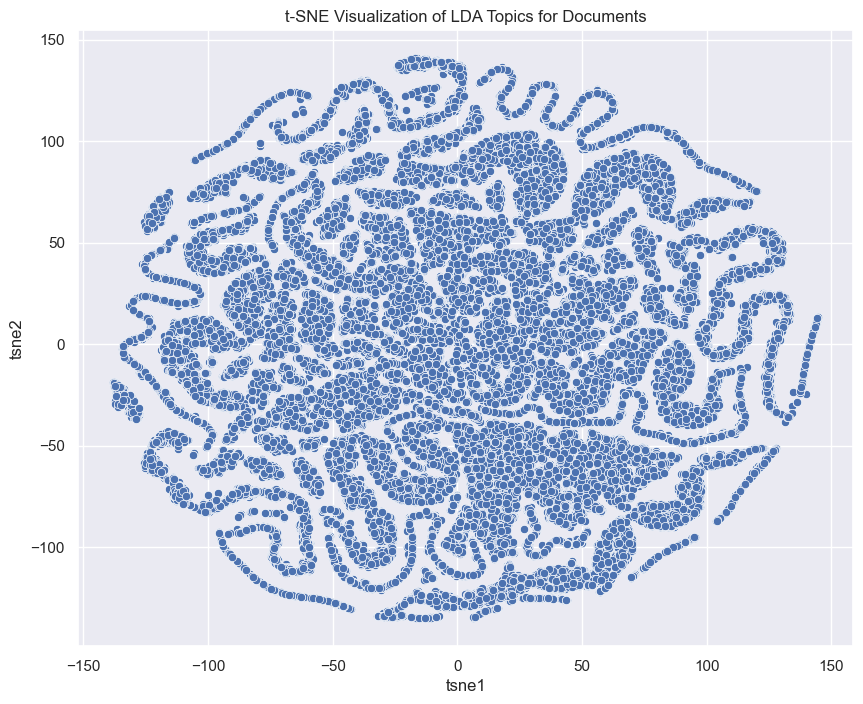

In [118]:
import numpy as np
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Extraire les distributions de sujets pour chaque document
doc_topic_vectors = [lda_model[doc] for doc in bow_corpus]

# Créer une liste de dictionnaires pour chaque document
topic_data = []

for topics in doc_topic_vectors:
    cleaned_topics = {f"Topic {t[0]}": t[1] if not np.isnan(t[1]) else 0.0 for t in topics}
    topic_data.append(cleaned_topics)

# Convertir en DataFrame
df_topic_sents_keywords = pd.DataFrame(topic_data)

# Vérifier et remplacer les NaN dans l'ensemble du DataFrame
df_topic_sents_keywords = df_topic_sents_keywords.fillna(0.0)

# Appliquer t-SNE pour réduire la dimension à 2
tsne_model = TSNE(n_components=2, random_state=42)
tsne_lda = tsne_model.fit_transform(df_topic_sents_keywords)

# Créer un DataFrame pour les résultats t-SNE
tsne_df = pd.DataFrame(tsne_lda, columns=['tsne1', 'tsne2'])

# Visualiser les résultats avec seaborn
plt.figure(figsize=(10, 8))
sns.scatterplot(x='tsne1', y='tsne2', data=tsne_df)
plt.title('t-SNE Visualization of LDA Topics for Documents')
plt.show()





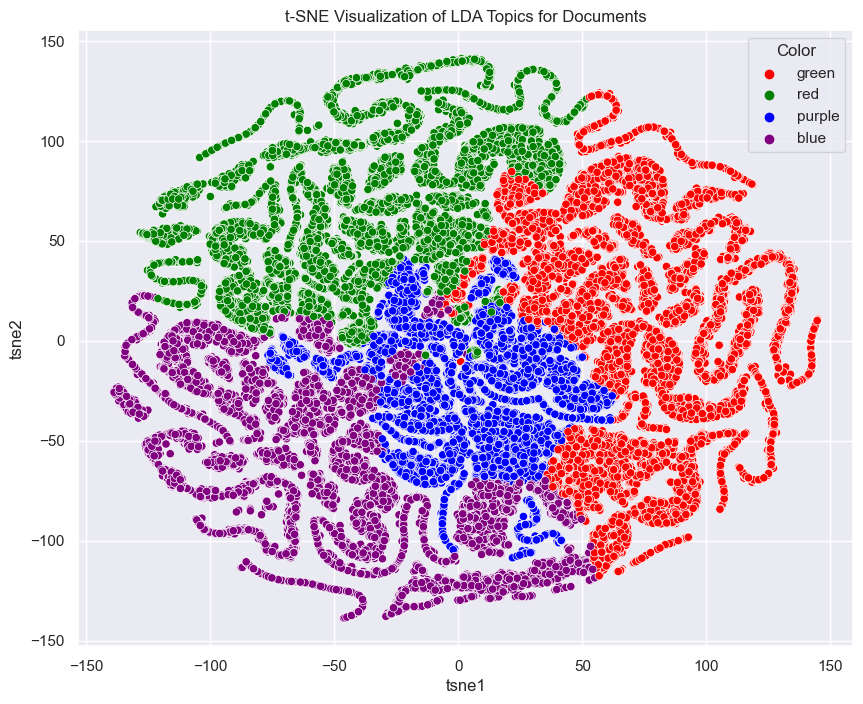

In [119]:
import numpy as np
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Extraire les distributions de sujets pour chaque document
doc_topic_vectors = [lda_model[doc] for doc in bow_corpus]

# Créer une liste de dictionnaires pour chaque document
topic_data = []

for topics in doc_topic_vectors:
    cleaned_topics = {f"Topic {t[0]}": t[1] if not np.isnan(t[1]) else 0.0 for t in topics}
    topic_data.append(cleaned_topics)

# Convertir en DataFrame
df_topic_sents_keywords = pd.DataFrame(topic_data)

# Vérifier et remplacer les NaN dans l'ensemble du DataFrame
df_topic_sents_keywords = df_topic_sents_keywords.fillna(0.0)

# Appliquer t-SNE pour réduire la dimension à 2
tsne_model = TSNE(n_components=2, random_state=42)
tsne_lda = tsne_model.fit_transform(df_topic_sents_keywords)

# Créer un DataFrame pour les résultats t-SNE
tsne_df = pd.DataFrame(tsne_lda, columns=['tsne1', 'tsne2'])

# Ajouter une colonne pour le nom du topic principal (Top 1)
tsne_df['Top_Topic'] = df_topic_sents_keywords.idxmax(axis=1)

# Ajouter une colonne pour la couleur du topic principal
topic_colors = {
    'Topic 0': 'red',
    'Topic 1': 'green',
    'Topic 2': 'blue',
    'Topic 3': 'purple'
}

tsne_df['Color'] = tsne_df['Top_Topic'].map(topic_colors)

# Visualiser les résultats avec seaborn
plt.figure(figsize=(10, 8))
sns.scatterplot(x='tsne1', y='tsne2', hue='Color', data=tsne_df, palette=topic_colors.values(), legend='full')

# Ajouter des annotations pour les points
#for idx, row in tsne_df.iterrows():
    #plt.annotate(row['Top_Topic'], (row['tsne1'], row['tsne2']), fontsize=8)

plt.title('t-SNE Visualization of LDA Topics for Documents')
plt.show()


## Analyse de sentiments avec TextBlob

In [120]:
# import de la librairie
! pip install TextBlob


In [121]:
import textblob

from textblob import TextBlob

# Calcule de la polarité
df_1['polarity'] = df_1['Processed_Text'].apply(lambda x: TextBlob(x).sentiment[0])
df_1['subjectivity'] = df_1['Processed_Text'].apply(lambda x: TextBlob(x).sentiment[1])

# Définir les étiquettes de sentiment en fonction de la polarité
df_1['Sentiment'] = df_1['polarity'].apply(lambda x: 'Positif' if x > 0 else ('Négatif' if x < 0 else 'Neutre'))
df_1.head(20)

,Original_Text,Processed_Text,_len_txt_orig,_len_txt_proc,polarity,subjectivity,Sentiment
0,The food is just average and very overpriced a...,food average greasy price three interior cold ...,179,70,-0.375000,0.700000,Négatif
1,I paid 20 for the gator plate which was the sa...,gator plate thing gator rip coming gumbo nasty,155,46,-1.000000,1.000000,Négatif
2,I really like the staff behind the counter and...,like staff behind counter food used time last ...,896,383,-0.232955,0.527083,Négatif
3,This is not Chinese food It s like aliens land...,food like landed earth found menu lying ground...,1033,432,-0.045312,0.604688,Négatif
4,Definitely not like it used to be I ordered th...,like used ordered whiskey river onion onion bu...,357,126,0.000000,0.000000,Neutre
5,We had to wait 10 minutes before they put in o...,wait put drink order slow night walk random wa...,575,247,-0.321667,0.375000,Négatif
6,Not taking any covid safety measures None of t...,taking covid safety none kitchen staff wearing...,191,94,-0.071429,0.511905,Négatif
7,only a buffet even for dinner food was cold an...,buffet dinner food cold tasted awful mess brea...,190,100,-0.153571,0.603571,Négatif
8,Made the mistake of utilizing the 10 off disco...,made mistake discount booked tour waste time m...,708,321,-0.186565,0.375340,Négatif
9,I usually don t complain about anything but th...,complain anything way many time horrible every...,296,123,-0.126488,0.644345,Négatif


# 2. Analyse des images (à partir des images postées par les clients)

In [122]:
! pip install pillow

In [123]:
# Importer les librairies nécessaires
import numpy as np
import matplotlib.pyplot as plt
import os
import PIL
import PIL.Image
import PIL.ImageStat

import tensorflow as tf
from tensorflow import keras

from tensorflow.keras.utils import to_categorical
from tensorflow.keras import layers


C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\tensorflow\core\framework\tensor_shape_pb2.py:18: DeprecationWarning: Call to deprecated create function FileDescriptor(). Note: Create unlinked descriptors is going to go away. Please use get/find descriptors from generated code or query the descriptor_pool.
  DESCRIPTOR = _descriptor.FileDescriptor(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\tensorflow\core\framework\tensor_shape_pb2.py:36: DeprecationWarning: Call to deprecated create function FieldDescriptor(). Note: Create unlinked descriptors is going to go away. Please use get/find descriptors from generated code or query the descriptor_pool.
  _descriptor.FieldDescriptor(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\tensorflow\core\framework\tensor_shape_pb2.py:43: DeprecationWarning: Call to deprecated create function FieldDescriptor(). Note: Create unlinked descriptors is going to go away. Please use get/find descriptors from 

In [132]:
! dir 

#! pip install google-auth google-auth-oauthlib google-auth-httplib2

 Le volume dans le lecteur C s’appelle Windows
 Le numéro de série du volume est F6CA-6D9F

 Répertoire de C:\Users\andre\OC Projets\P6 - NLP

09/12/2023  07:37    <DIR>          .
05/12/2023  17:17    <DIR>          ..
08/12/2023  13:56    <DIR>          .ipynb_checkpoints
04/12/2023  10:53        72 003 677 df_text.csv
07/12/2023  04:03    <DIR>          Dossier_Images_P6_NLP
08/12/2023  11:57            23 331 matrice_confusion_VGG16.png
08/12/2023  12:44        60 007 888 model1_best_weights.h5
08/12/2023  12:57        60 007 888 model2_best_weights.h5
08/12/2023  12:55             2 487 modele_2_supervise_convolution.png
08/12/2023  15:14        11 793 855 P6_Avis_restaurants(def).ipynb
09/12/2023  07:37        11 413 692 P6_Avis_restaurants(def_copie).ipynb
08/12/2023  09:27            18 208 restaurants.csv
08/12/2023  13:00            53 863 standard.png
08/12/2023  11:53             2 487 visualisation_classe_maj_KmeansVGG16_vraies_classes.png
08/12/2023  11:48             2 4

In [133]:
! pip install pathlib
import pathlib

In [134]:
import os
# récupérer le chemin du répertoire courant
path = os.getcwd()
print("Le répertoire courant est : " + path)
# récupérer le nom du répertoire courant
repn = os.path.basename(path)
print("Le nom du répertoire est : " + repn)

Le répertoire courant est : C:\Users\andre\OC Projets\P6 - NLP
Le nom du répertoire est : P6 - NLP


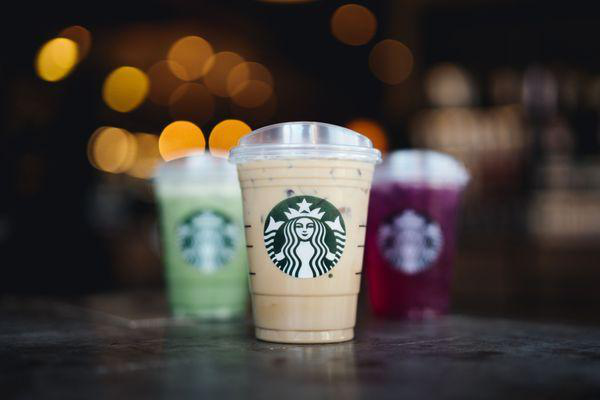

In [135]:
import PIL
from PIL import Image

img = Image.open(r"C:\Users\andre\OC Projets\P6 - NLP\Dossier_Images_P6_NLP\dfdrink\706nCeG3Ryud_nT5raiJeA.jpg")
img

Processing images in .ipynb_checkpoints
Processing images in dfdrink
Processing images in dffood
Processing images in dfinside
Processing images in dfmenu
Processing images in dfoutside


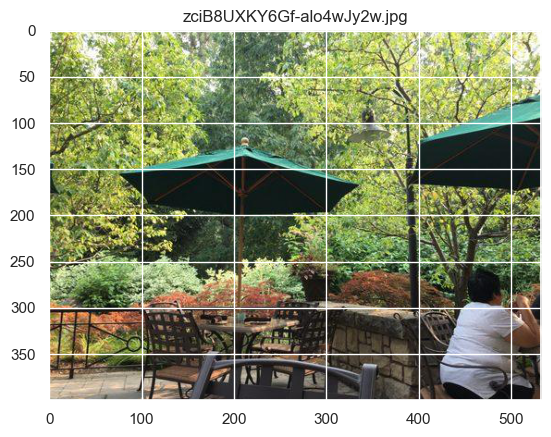

In [136]:
from PIL import Image
import matplotlib.pyplot as plt
import pathlib

# Define the path to the parent directory containing subdirectories with images
dataset_orig = (r"C:\Users\andre\OC Projets\P6 - NLP\Dossier_Images_P6_NLP")
data_dir = pathlib.Path(dataset_orig)

# Get a list of subdirectories
subdirectories = [subdir for subdir in data_dir.iterdir() if subdir.is_dir()]

# Display images from each subdirectory
for subdir in subdirectories:
    print(f"Processing images in {subdir.name}")
    
    # Get a list of image files in the subdirectory
    image_files = list(subdir.glob("*.jpg")) + list(subdir.glob("*.png"))  # Adjust file extensions as needed
    
    # Display each image in the subdirectory
    for image_file in image_files:
        # Open the image using PIL
        image = Image.open(image_file)

        # Display the image using Matplotlib
        plt.imshow(image)
        plt.title(image_file.name)  # Display the file name as the title


#### Comptage des images disponibles

In [137]:
image_count = len(list(data_dir.glob('*/*.jpg')))
print(image_count)

250


#### Vérification de la lecture des images

In [138]:
dffood = list(data_dir.glob('dffood/*'))# la fonction glob() est utilisée pour trouver tous les fichiers dans le répertoire data_dir qui correspondent au modèle *.
PIL.Image.open(str(dffood[0]))

TypeError: 'list' object is not callable

In [131]:
dfdrink = list(data_dir.glob('dfdrink/*'))
PIL.Image.open(str(dfdrink[22]))

TypeError: 'list' object is not callable

## Chargement des images utilisant tf.keras.utils.image_dataset_from_directory

## Accès aux données depuis l'arborescence et création d'un df "data"

In [139]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
import os
from os import listdir
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, auc, roc_auc_score, roc_curve
from glob import glob

import tensorflow as tf
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.layers import GlobalAveragePooling2D, GlobalAveragePooling1D, Flatten, Dense, Dropout
from tensorflow.keras.layers import Rescaling, RandomFlip, RandomRotation, RandomZoom
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras.applications.vgg16 import VGG16
from tensorflow.keras.applications.vgg16 import preprocess_input
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.utils import to_categorical

os.environ["TF_KERAS"]='1'
print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))

Num GPUs Available:  0


In [140]:
import os
import pandas as pd
from sklearn import preprocessing
from sklearn.preprocessing import LabelEncoder
from glob import glob

path = r"C:\Users\andre\OC Projets\P6 - NLP\Dossier_Images_P6_NLP"

list_labels = ["dfdrink", "dffood", "dfinside", "dfmenu", "dfoutside"]
label_no_name = "no_name "

def photo_class(photo):
    for label in list_labels:
        if label in photo[24:]:
            return label
    return label_no_name

data_path = glob(os.path.join(path, '*', '*.jpg'))

def data_fct(path):
    list_photos = [file for file in path]
    print(len(list_photos))
    data = pd.DataFrame()
    data["image_path"] = list_photos
    data["label_name"] = data["image_path"].apply(lambda x: photo_class(x))
    return data

data = data_fct(data_path)

le = preprocessing.LabelEncoder()
le.fit(data["label_name"])
data["label"] = le.transform(data["label_name"])

data.tail(5)


250


,image_path,label_name,label
245,C:\Users\andre\OC Projets\P6 - NLP\Dossier_Ima...,dfoutside,4
246,C:\Users\andre\OC Projets\P6 - NLP\Dossier_Ima...,dfoutside,4
247,C:\Users\andre\OC Projets\P6 - NLP\Dossier_Ima...,dfoutside,4
248,C:\Users\andre\OC Projets\P6 - NLP\Dossier_Ima...,dfoutside,4
249,C:\Users\andre\OC Projets\P6 - NLP\Dossier_Ima...,dfoutside,4


#### Vérification de la composition du df "data"

In [141]:
data.groupby("label").count()

,image_path,label_name
label,,
0,50,50
1,50,50
2,50,50
3,50,50
4,50,50


In [142]:
data.head()

,image_path,label_name,label
0,C:\Users\andre\OC Projets\P6 - NLP\Dossier_Ima...,dfdrink,0
1,C:\Users\andre\OC Projets\P6 - NLP\Dossier_Ima...,dfdrink,0
2,C:\Users\andre\OC Projets\P6 - NLP\Dossier_Ima...,dfdrink,0
3,C:\Users\andre\OC Projets\P6 - NLP\Dossier_Ima...,dfdrink,0
4,C:\Users\andre\OC Projets\P6 - NLP\Dossier_Ima...,dfdrink,0


#### Identification pour vérification du vecteur de classement

In [143]:
# Vérification par index (l, col) du classement des
data.iloc[224, 2]

4

In [144]:
# Vérification par index (l, col) du classement des
data.iloc[113, 2]

2

In [145]:
# Vérification par index (l, col) du classement des
data.iloc[0, 2]

0

In [146]:
# Vérification par index (l, col) du classement des
data.iloc[56, 2]

1

#### Affichage des quelques images pour vérification du bon chargement

dfdrink


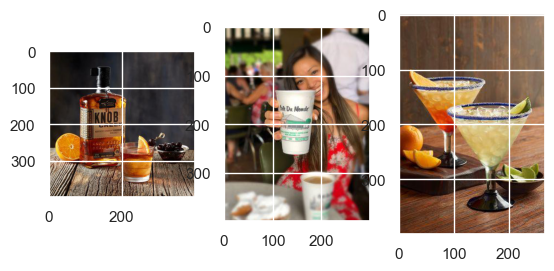

dffood


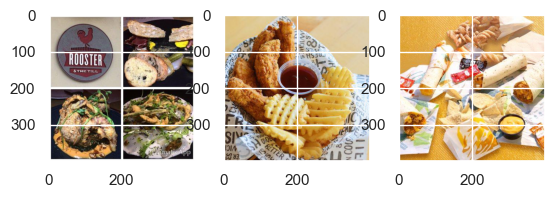

dfinside


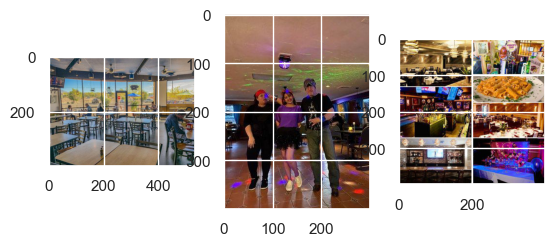

dfmenu


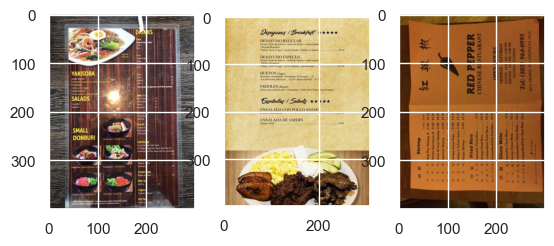

dfoutside


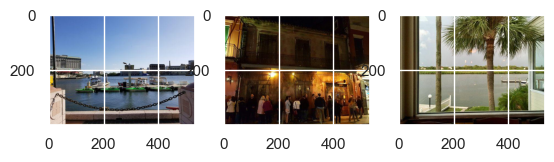

In [147]:
from matplotlib.image import imread

def list_fct(name) :
    list_image_name = [data["image_path"][i] for i in range(len(data)) if data["label_name"][i]==name]
    return list_image_name

list_drink=[data["image_path"][i] for i in range(len(data)) if data["label_name"][i]=="dfdrink"]
list_food=[data["image_path"][i] for i in range(len(data)) if data["label_name"][i]=="dffood"]
list_inside=[data["image_path"][i] for i in range(len(data)) if data["label_name"][i]=="dfinside"]
list_menu=[data["image_path"][i] for i in range(len(data)) if data["label_name"][i]=="dfmenu"]
list_outside=[data["image_path"][i] for i in range(len(data)) if data["label_name"][i]=="dfoutside"]

for name in list_labels :
    print(name)
    # print("-------")
    for i in range(3):
        plt.subplot(130 + 1 + i)
        filename = list_fct(name)[i+10]
        image = imread(filename)
        plt.imshow(image)
    plt.show()

# Pré-traîtement des images

In [148]:
! pip install opencv-python

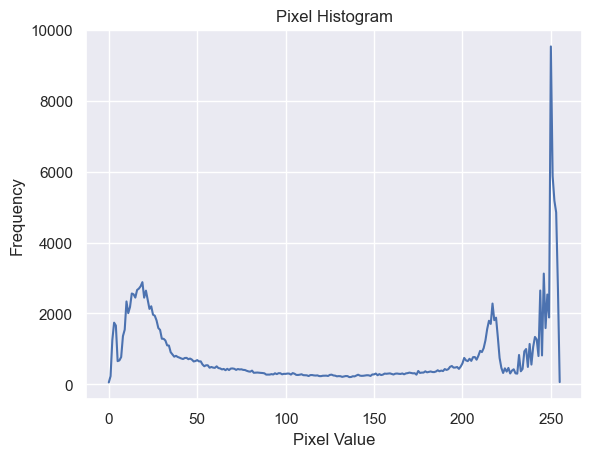

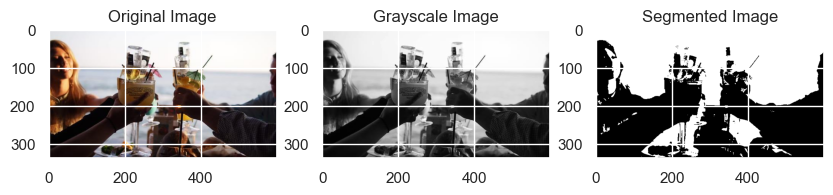

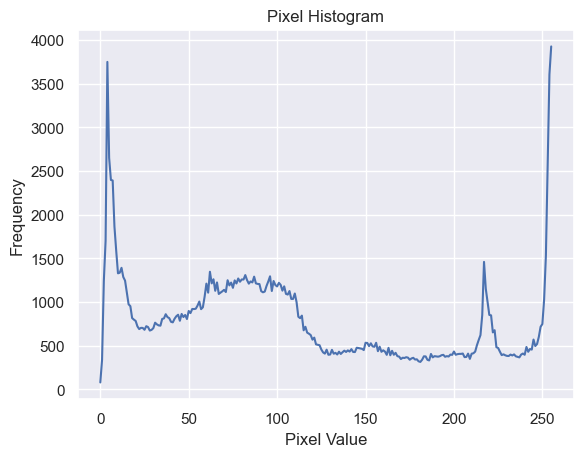

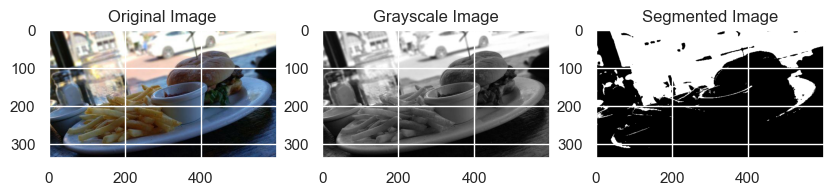

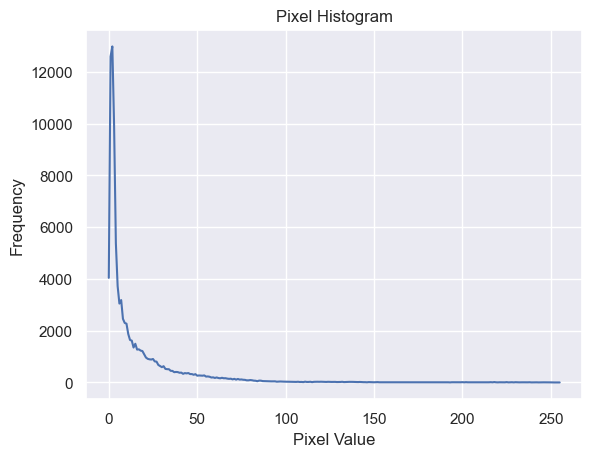

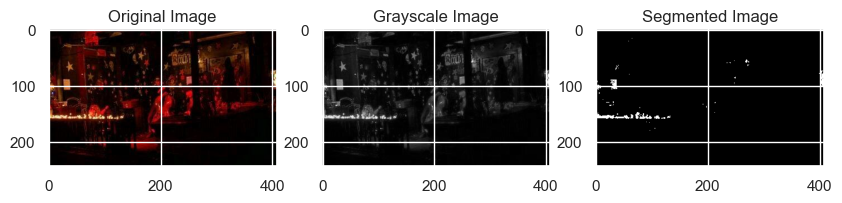

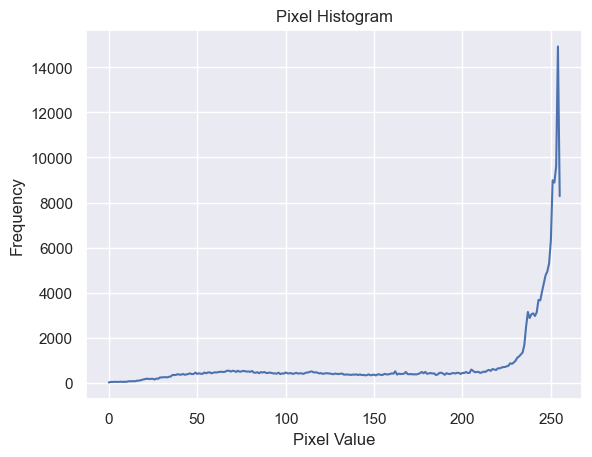

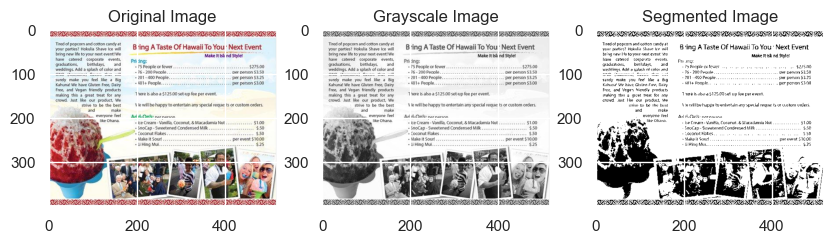

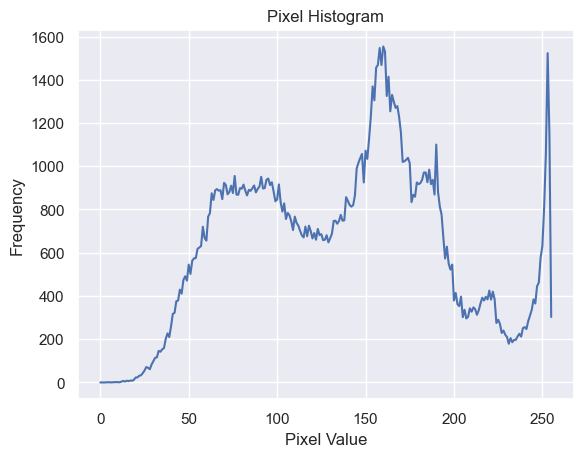

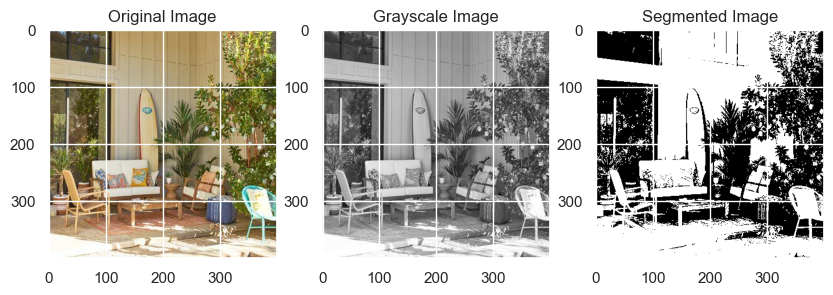

In [149]:
import cv2
import numpy as np

# Charger une image et effectuer le prétraitement
def preprocess_image(image_path):
    # Charger l'image
    original_image = cv2.imread(image_path)
    
    # Convertir en niveaux de gris
    gray_image = cv2.cvtColor(original_image, cv2.COLOR_BGR2GRAY)
    
    # Afficher l'histogramme de pixels
    hist = cv2.calcHist([gray_image], [0], None, [256], [0, 256])
    plt.plot(hist)
    plt.title("Pixel Histogram")
    plt.xlabel("Pixel Value")
    plt.ylabel("Frequency")
    plt.show()
    
    # Appliquer une segmentation
    _, segmented_image = cv2.threshold(gray_image, 128, 255, cv2.THRESH_BINARY)
    
    return gray_image, segmented_image

# Echantillonner des images par classe
for label in list_labels:
    # Sélectionner une image de chaque classe
    sample_image_path = data[data["label_name"] == label]["image_path"].iloc[0]
    
    # Prétraiter l'image
    gray_image, segmented_image = preprocess_image(sample_image_path)
    
    # Afficher les images prétraitées
    plt.figure(figsize=(10, 5))
    
    plt.subplot(1, 3, 1)
    plt.imshow(cv2.cvtColor(cv2.imread(sample_image_path), cv2.COLOR_BGR2RGB))
    plt.title("Original Image")
    
    plt.subplot(1, 3, 2)
    plt.imshow(gray_image, cmap='gray')
    plt.title("Grayscale Image")
    
    plt.subplot(1, 3, 3)
    plt.imshow(segmented_image, cmap='gray')
    plt.title("Segmented Image")
    
    plt.show()


#### SIFT

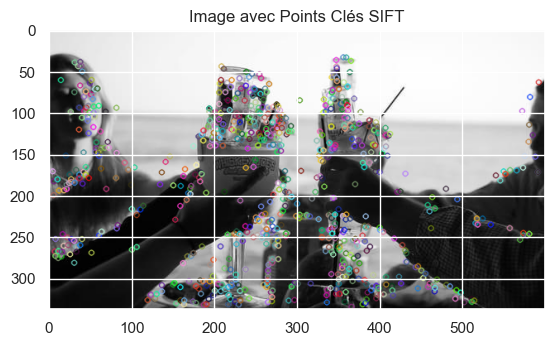

In [150]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Charger une image à partir de votre DataFrame (par exemple, la première image)
image_path = data['image_path'].iloc[0]
image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

# Initialiser l'objet SIFT
sift = cv2.SIFT_create()

# Trouver les points clés et les descripteurs avec SIFT
keypoints, descriptors = sift.detectAndCompute(image, None)

# Dessiner les points clés sur l'image
image_with_keypoints = cv2.drawKeypoints(image, keypoints, None)

# Afficher l'image avec les points clés à l'aide de Matplotlib
plt.imshow(image_with_keypoints, cmap='gray')
plt.title('Image avec Points Clés SIFT')
plt.show()



### Création des descripteurs 

In [151]:
import cv2
import numpy as np
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt

# Charger les images et calculer les descripteurs SIFT
descriptors_list = []
for image_path in data['image_path']:
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    keypoints, descriptors = sift.detectAndCompute(image, None)
    descriptors_list.append(descriptors)

# Concaténer tous les descripteurs pour former une seule matrice
all_descriptors = np.concatenate(descriptors_list, axis=0)
print(all_descriptors)

[[ 95.  23.   0. ...   0.   1.   2.]
 [  3.   0.   0. ...   0.   1.   7.]
 [132.  85.   0. ...   0.   0.   0.]
 ...
 [  9.  14.  25. ...   0.   0.   0.]
 [ 16.   0.   0. ...  81.  73.  24.]
 [ 11.  45.  76. ...   0.   0.   0.]]


In [152]:
import cv2
import numpy as np

# Charger une image à partir de votre DataFrame (par exemple, la première image)
image_path = data['image_path'].iloc[0]
image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

# Trouver les points clés et les descripteurs avec SIFT
sift = cv2.SIFT_create()
keypoints, descriptors = sift.detectAndCompute(image, None)

# Afficher la forme des descripteurs
print("Forme des descripteurs SIFT:", descriptors.shape)


Forme des descripteurs SIFT: (783, 128)


### Visual words

### Réduction de dimension - ACP 

In [153]:
from sklearn import manifold, decomposition

print(descriptors.shape)
pca = decomposition.PCA(n_components=0.99)
femat_pca= pca.fit_transform(descriptors)
print(femat_pca.shape)

(783, 128)
(783, 104)


### Réduction de dimension T-SNE et affichage des images selon vraies classes

In [154]:
from sklearn import manifold, decomposition
import time

temps1 = time.time()

tsne_sift = manifold.TSNE(n_components=2, perplexity=30, n_iter=2000, init='random', random_state=42)
X_tsne_sift = tsne_sift.fit_transform(femat_pca)

duration1=time.time()-temps1
print("temps de T-SNE : ", "%15.2f" % duration1, "secondes")

temps de T-SNE :             2.77 secondes


### Visualisation du TSNE selon les vraies classes

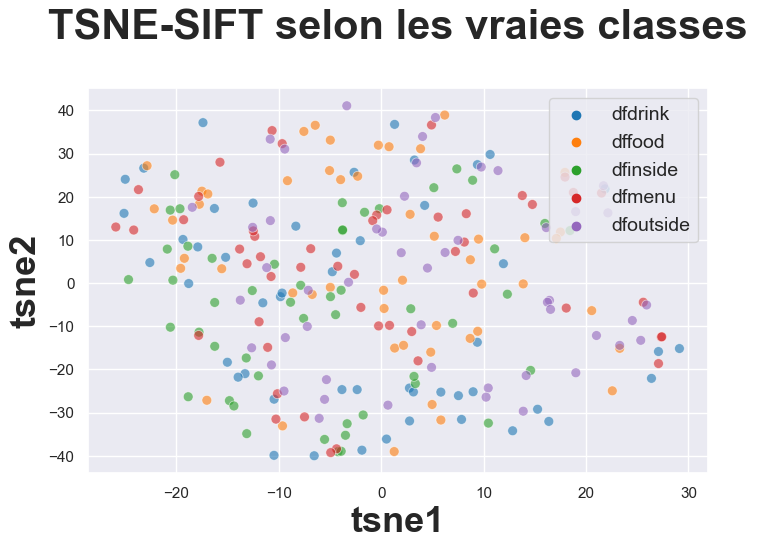

In [155]:
df_tsne_sift = pd.DataFrame(X_tsne_sift, columns=['tsne1', 'tsne2'])
df_tsne_sift["class"] = data["label_name"]

plt.figure(figsize=(8,5))
sns.scatterplot(
    x="tsne1", y="tsne2",
    hue="class",
    palette=sns.color_palette('tab10', n_colors=5), s=50, alpha=0.6,
    data=df_tsne_sift,
    legend="brief")

plt.title('TSNE-SIFT selon les vraies classes', fontsize = 30, pad = 35, fontweight = 'bold')
plt.xlabel('tsne1', fontsize = 26, fontweight = 'bold')
plt.ylabel('tsne2', fontsize = 26, fontweight = 'bold')
plt.legend(prop={'size': 14})

# Enregistrer le graphique en tant qu'image 
plt.savefig('visualisation_tsne_sift_vraies_classes.png', bbox_inches='tight')

# Afficher le graphique
plt.show()

* Nous observons ici qu'une séparation automatique des images selon les vraies classes avec la méthode SIFT ne semble pas être très efficace. 
* Ceci nous conduit à nous intérroger sur la feasabilité d'une classification efficace depuis cet angle.
* Nous utilisons le modèle pré-entrainé de VGG16 pour voir 

In [156]:
df_tsne_sift.head()

,tsne1,tsne2,class
0,5.819905,-25.243036,dfdrink
1,-16.295507,17.281374,dfdrink
2,11.927046,4.489452,dfdrink
3,21.850550,21.804426,dfdrink
4,2.750680,-24.305601,dfdrink


# Etude de faisabilité avec VGG16

#### Création d'un modèle pré-entraîné avec VGG16

In [157]:
base_model = VGG16()
model = Model(inputs=base_model.inputs, outputs=base_model.layers[-2].output)#on enlève la tête pour pouvoir le réutiliser sur notre jeu des données

print(model.summary())

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\random.py:370: DeprecationWarning: non-integer arguments to randrange() have been deprecated since Python 3.10 and will be removed in a subsequent version
  return self.randrange(a, b+1)
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\random.py:370: DeprecationWarning: non-integer arguments to randrange() have been deprecated since Python 3.10 and will be removed in a subsequent version
  return self.randrange(a, b+1)
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\random.py:370: DeprecationWarning: non-integer arguments to randrange() have been deprecated since Python 3.10 and will be removed in a subsequent version
  return self.randrange(a, b+1)
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\random.py:370: DeprecationWarning: non-integer arguments to randrange() have been deprecated since Python 3.10 and will be removed in a subsequent version
  return self.randrange(a, b+1)
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\random.

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0     

### Création des features des images

In [158]:
images_features = []
i=0
for image_file in data["image_path"] :
    if i%100 == 0 : print(i)
    i +=1
    image = load_img(image_file, target_size=(224, 224))
    image = img_to_array(image)
    image = np.expand_dims(image, axis=0)
    image = preprocess_input(image)
    images_features.append(model.predict(image)[0]) # predict from pretrained model

images_features = np.asarray(images_features)
images_features.shape

0
1/1 [==============================] - 0s 90ms/step
100
1/1 [==============================] - 0s 86ms/step
200
1/1 [==============================] - 0s 78ms/step


(250, 4096)

### Réduction dimension et analyse en composantes principales (ACP)

In [159]:
from sklearn import manifold, decomposition

print(images_features.shape)
pca = decomposition.PCA(n_components=0.99)#On retient 0.99% de variance
feat_pca= pca.fit_transform(images_features)
print(feat_pca.shape)

(250, 4096)
(250, 229)


### Réduction de dimension T-SNE et affichage des images selon vraies classes

In [160]:
from sklearn import manifold, decomposition
import time

temps1 = time.time()

tsne = manifold.TSNE(n_components=2, perplexity=30, n_iter=2000, init='random', random_state=42)
X_tsne = tsne.fit_transform(feat_pca)

duration1=time.time()-temps1
print("temps de T-SNE : ", "%15.2f" % duration1, "secondes")

temps de T-SNE :             0.89 secondes


#### Visualisation du TSN selon les vraies classes

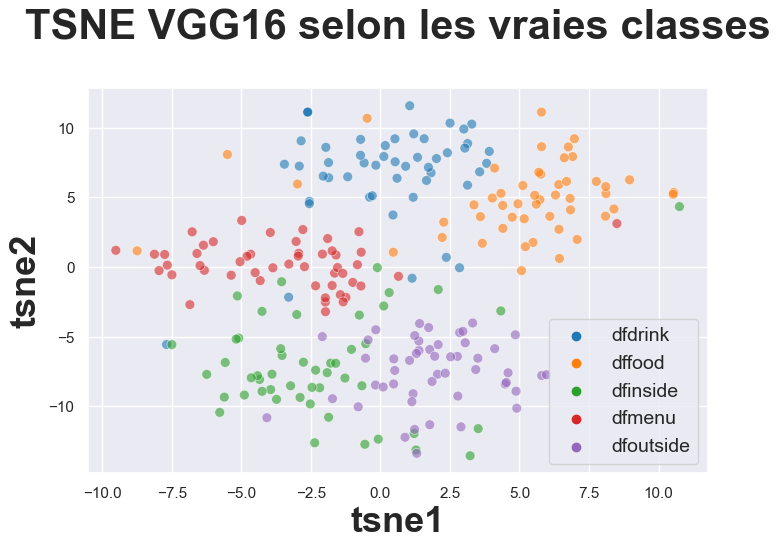

In [161]:
df_tsne = pd.DataFrame(X_tsne, columns=['tsne1', 'tsne2'])
df_tsne["class"] = data["label_name"]

plt.figure(figsize=(8,5))
sns.scatterplot(
    x="tsne1", y="tsne2",
    hue="class",
    palette=sns.color_palette('tab10', n_colors=5), s=50, alpha=0.6,
    data=df_tsne,
    legend="brief")

plt.title('TSNE VGG16 selon les vraies classes', fontsize = 30, pad = 35, fontweight = 'bold')
plt.xlabel('tsne1', fontsize = 26, fontweight = 'bold')
plt.ylabel('tsne2', fontsize = 26, fontweight = 'bold')
plt.legend(prop={'size': 14})

# Enregistrer le graphique en tant qu'image 
plt.savefig('visualisation_tsne_VGG16_vraies_classes.png', bbox_inches='tight')

plt.show()

### Kmeans pour clustérisation

#### - Kmeans sur 5 clusters pour les 5 labels à trouver

In [162]:
from sklearn import cluster, metrics

cls = cluster.KMeans(n_clusters=5, n_init=100)
cls.fit(X_tsne)

KMeans(n_clusters=5, n_init=100)

#### - Visualisation des résultats du Kmeans sur les 5 clusters

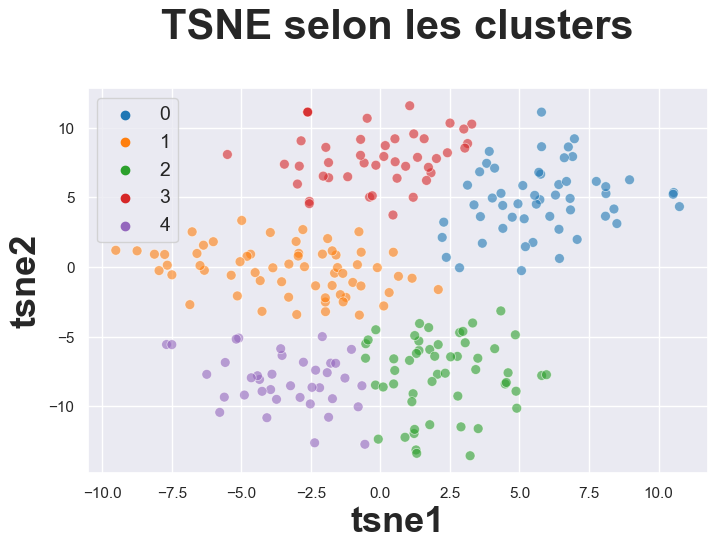

ARI :  0.6824919895258987


In [163]:
df_tsne["cluster"] = cls.labels_

plt.figure(figsize=(8,5))
sns.scatterplot(
    x="tsne1", y="tsne2",
    hue="cluster",
    palette=sns.color_palette('tab10', n_colors=5), s=50, alpha=0.6,
    data=df_tsne,
    legend="brief")

plt.title('TSNE selon les clusters', fontsize = 30, pad = 35, fontweight = 'bold')
plt.xlabel('tsne1', fontsize = 26, fontweight = 'bold')
plt.ylabel('tsne2', fontsize = 26, fontweight = 'bold')
plt.legend(prop={'size': 14})

# Enregistrer le graphique en tant qu'image 
plt.savefig('visualisation_tsne_VGG16_clusters.png', bbox_inches='tight')

plt.show()

labels = data["label"]
print("ARI : ", metrics.adjusted_rand_score(labels, cls.labels_))

Notre score ARI est de 0.6824919895258987 cela implique que les clusters trouvés par le modèle K-means sont en moyenne de 68,24% similaires aux classes réelles des images. Cela signifie que le modèle a fait un bon travail de regroupement des images en fonction de leurs caractéristiques. Cependant, il est important de noter que l'ARI est une mesure de cohérence, pas de précision. Un score de ce type nous permet d'inférer que le modèle a regroupé des images de différentes classes dans le même cluster ou qu'il ait fait des erreurs de classification sur des images qui font pourtant partie de chaque classe réelle. Pour voir un peu à quoi ressemble le classement par cluster et s'il conincide ou non avec les labels réels, nous faissons un print du df_tsne, que maintenant inclut la colonne cluster.

In [164]:
df_tsne.head()

,tsne1,tsne2,class,cluster
0,1.053682,11.573897,dfdrink,3
1,1.819168,6.763464,dfdrink,3
2,2.014683,7.787939,dfdrink,3
3,-3.300561,-2.161571,dfdrink,1
4,-0.389811,5.018789,dfdrink,3


#### Accès simplifié aux classes majoritairement attribuée par cluster par le Kmeans

In [165]:
# Obtenir les étiquettes réelles des images de chaque cluster
labels_par_cluster = df_tsne.groupby("cluster")["class"].value_counts()

# Afficher les étiquettes réelles des images du cluster 0
print(labels_par_cluster[0])

class
dffood      45
dfdrink      6
dfinside     1
dfmenu       1
Name: count, dtype: int64


Nous inférons que la classe majoriatire est du cluster 0 est dfoutside

In [166]:
# Obtenir les étiquettes réelles des images de chaque cluster
labels_par_cluster = df_tsne.groupby("cluster")["class"].value_counts()

# Afficher les étiquettes réelles des images du cluster 1
print(labels_par_cluster[1])

class
dfmenu      49
dfinside     9
dfdrink      2
dffood       2
Name: count, dtype: int64


In [167]:
# Obtenir les étiquettes réelles des images de chaque cluster
labels_par_cluster = df_tsne.groupby("cluster")["class"].value_counts()

# Afficher les étiquettes réelles des images du cluster 2
print(labels_par_cluster[2])

class
dfoutside    46
dfinside      7
Name: count, dtype: int64


In [168]:
# Obtenir les étiquettes réelles des images de chaque cluster
labels_par_cluster = df_tsne.groupby("cluster")["class"].value_counts()

# Afficher les étiquettes réelles des images du cluster 3
print(labels_par_cluster[3])

class
dfdrink    41
dffood      3
Name: count, dtype: int64


#### Visualisation des clusters par classe majoritaire selon le Kmeans


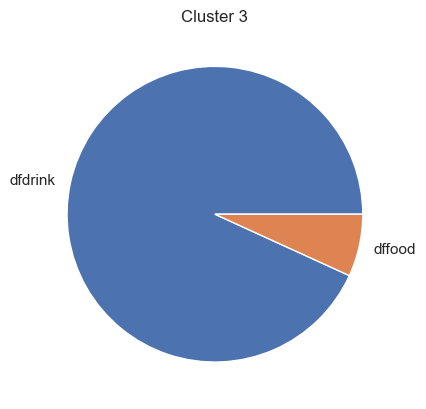

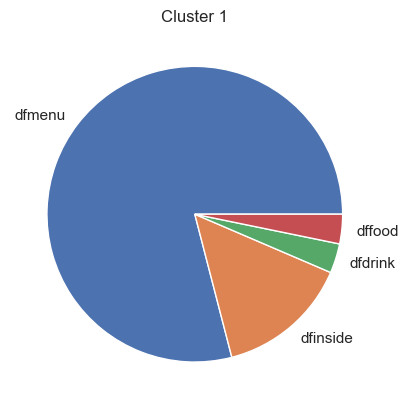

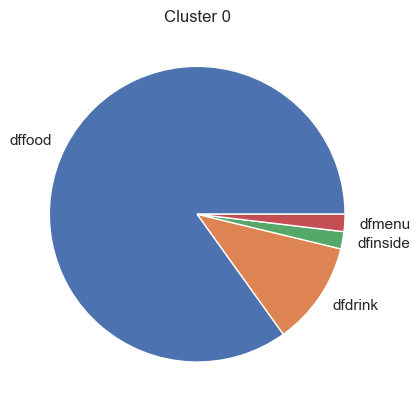

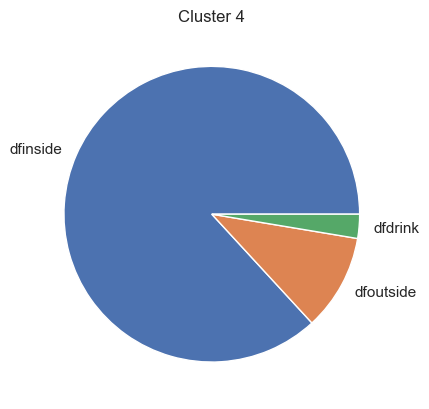

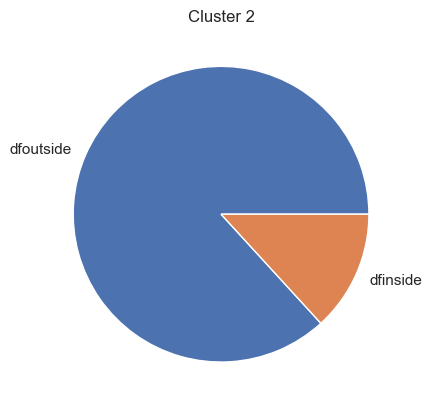

<Figure size 640x480 with 0 Axes>

In [169]:
for cluster in df_tsne["cluster"].unique():
    plt.pie(labels_par_cluster[cluster], labels=labels_par_cluster[cluster].index)
    plt.title(f"Cluster {cluster}")
    plt.show()

# Enregistrer le graphique en tant qu'image 
plt.savefig('visualisation_classe_maj_KmeansVGG16_vraies_classes.png', bbox_inches='tight')

#### Analyse des images "mal-classées"

1. Classement Tnse

In [170]:
df_tsne.head()

,tsne1,tsne2,class,cluster
0,1.053682,11.573897,dfdrink,3
1,1.819168,6.763464,dfdrink,3
2,2.014683,7.787939,dfdrink,3
3,-3.300561,-2.161571,dfdrink,1
4,-0.389811,5.018789,dfdrink,3


##### 2. Classement LE (classes réelles) 

In [171]:
data.head()

,image_path,label_name,label
0,C:\Users\andre\OC Projets\P6 - NLP\Dossier_Ima...,dfdrink,0
1,C:\Users\andre\OC Projets\P6 - NLP\Dossier_Ima...,dfdrink,0
2,C:\Users\andre\OC Projets\P6 - NLP\Dossier_Ima...,dfdrink,0
3,C:\Users\andre\OC Projets\P6 - NLP\Dossier_Ima...,dfdrink,0
4,C:\Users\andre\OC Projets\P6 - NLP\Dossier_Ima...,dfdrink,0


##### 3. Vérification humaine 

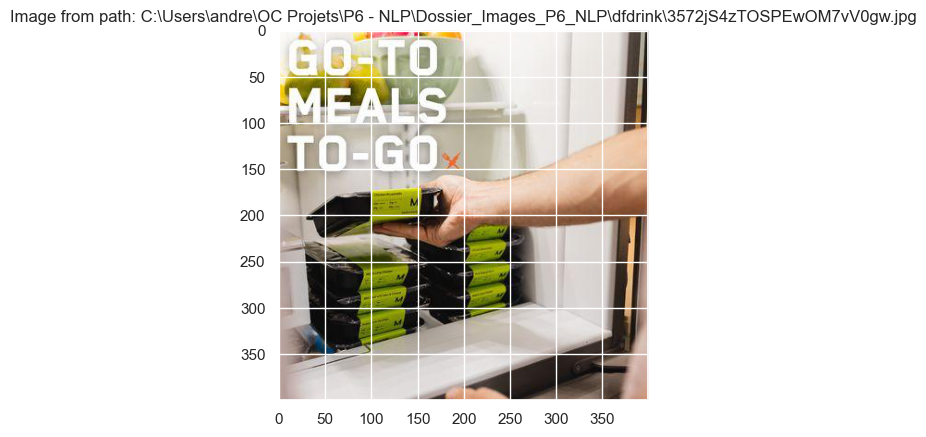

In [172]:
# Affichage de l'image classé  dans le cluster 4 = "dfdrink" dans le tsne mais qui en réalité fait partie d'un autre cluster (0 pour cet exemple)

image_path = data['image_path'].iloc[3]
image = plt.imread(image_path)

plt.imshow(image)
plt.title(f"Image from path: {image_path}")
plt.show()

### Analyse par classes

In [173]:
conf_mat = metrics.confusion_matrix(labels, cls.labels_)
print(conf_mat)

[[ 6  2  0 41  1]
 [45  2  0  3  0]
 [ 1  9  7  0 33]
 [ 1 49  0  0  0]
 [ 0  0 46  0  4]]


In [174]:
def conf_mat_transform(y_true,y_pred) :
    conf_mat = metrics.confusion_matrix(y_true,y_pred)

    corresp = np.argmax(conf_mat, axis=0)
    print ("Correspondance des clusters : ", corresp)
    # y_pred_transform = np.apply_along_axis(correspond_fct, 1, y_pred)
    labels = pd.Series(y_true, name="y_true").to_frame()
    labels['y_pred'] = y_pred
    labels['y_pred_transform'] = labels['y_pred'].apply(lambda x : corresp[x])

    return labels['y_pred_transform']

In [175]:
cls_labels_transform = conf_mat_transform(labels, cls.labels_)
conf_mat = metrics.confusion_matrix(labels, cls_labels_transform)
print(conf_mat)
print()
print(metrics.classification_report(labels, cls_labels_transform))

Correspondance des clusters :  [1 3 4 0 2]
[[41  6  1  2  0]
 [ 3 45  0  2  0]
 [ 0  1 33  9  7]
 [ 0  1  0 49  0]
 [ 0  0  4  0 46]]

              precision    recall  f1-score   support

           0       0.93      0.82      0.87        50
           1       0.85      0.90      0.87        50
           2       0.87      0.66      0.75        50
           3       0.79      0.98      0.87        50
           4       0.87      0.92      0.89        50

    accuracy                           0.86       250
   macro avg       0.86      0.86      0.85       250
weighted avg       0.86      0.86      0.85       250



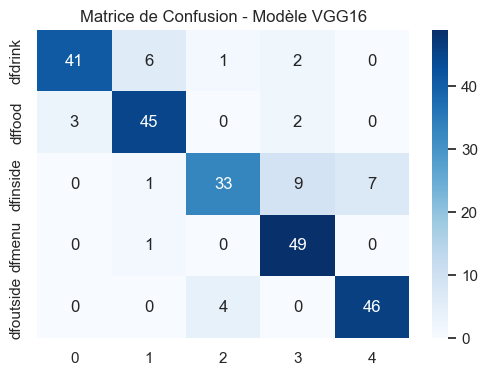

In [176]:
df_cm = pd.DataFrame(conf_mat, index = [label for label in list_labels],
                  columns = [i for i in "01234"])
plt.figure(figsize = (6,4))
sns.heatmap(df_cm, annot=True, cmap="Blues")

# Ajouter un titre
plt.title('Matrice de Confusion - Modèle VGG16')

# Enregistrer le graphique en tant qu'image 
plt.savefig('matrice_confusion_VGG16.png', bbox_inches='tight')

# Afficher le graphique
plt.show()



Nous observons que malgré un excellent travail de la part du VGG16, nous procédons à une classification supervisée pour voir si l'on peut avor des meilleurs résultats. 

# Etape 2 : classification supervisée

## Création du modèle de classification

In [177]:
def create_model_fct() :
    # Récupération modèle pré-entraîné
    model0 = VGG16(include_top=False, weights="imagenet", input_shape=(224, 224, 3))

    # Layer non entraînables = on garde les poids du modèle pré-entraîné
    for layer in model0.layers:
        layer.trainable = False

    # Récupérer la sortie de ce réseau
    x = model0.output
    # Compléter le modèle
    x = GlobalAveragePooling2D()(x)
    x = Dense(256, activation='relu')(x)
    x = Dropout(0.5)(x)
    predictions = Dense(5, activation='softmax')(x)

    # Définir le nouveau modèle
    model = Model(inputs=model0.input, outputs=predictions)
    # compilation du modèle
    model.compile(loss="categorical_crossentropy", optimizer='rmsprop', metrics=["accuracy"])

    print(model.summary())

    return model

## Approche préparation initiale des images

In [178]:
def image_prep_fct(data) :
    prepared_images = []
    for image_num in range(len(data['image_path'])) :
        img = (load_img(
            data['image_path'][image_num],
            target_size=(224, 224)))
        img = img_to_array(img)
        img = img.reshape((img.shape[0], img.shape[1], img.shape[2]))
        img = preprocess_input(img)
        prepared_images.append(img)
        prepared_images_np = np.array(prepared_images)
    return prepared_images_np

images_np = image_prep_fct(data)
print(images_np.shape)

(250, 224, 224, 3)


In [179]:
X = images_np
y = to_categorical(data['label'])

y

array([[1., 0., 0., 0., 0.],
       [1., 0., 0., 0., 0.],
       [1., 0., 0., 0., 0.],
       ...,
       [0., 0., 0., 0., 1.],
       [0., 0., 0., 0., 1.],
       [0., 0., 0., 0., 1.]], dtype=float32)

In [180]:
X_train, X_val, y_train, y_val = train_test_split(X, y, stratify=y, test_size=0.25, random_state=42)
X_train.shape

(187, 224, 224, 3)

In [181]:
X_val.shape

(63, 224, 224, 3)

In [182]:
# Création du modèle
with tf.device('/gpu:0'):
    model1 = create_model_fct()

# Création du callback
model1_save_path1 = "./model1_best_weights.h5"
checkpoint = ModelCheckpoint(model1_save_path1, monitor='val_loss', verbose=1, save_best_only=True, mode='min')
es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=4)
callbacks_list = [checkpoint, es]

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\random.py:370: DeprecationWarning: non-integer arguments to randrange() have been deprecated since Python 3.10 and will be removed in a subsequent version
  return self.randrange(a, b+1)
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\random.py:370: DeprecationWarning: non-integer arguments to randrange() have been deprecated since Python 3.10 and will be removed in a subsequent version
  return self.randrange(a, b+1)
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\random.py:370: DeprecationWarning: non-integer arguments to randrange() have been deprecated since Python 3.10 and will be removed in a subsequent version
  return self.randrange(a, b+1)
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\random.py:370: DeprecationWarning: non-integer arguments to randrange() have been deprecated since Python 3.10 and will be removed in a subsequent version
  return self.randrange(a, b+1)
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\random.

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0   

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\random.py:370: DeprecationWarning: non-integer arguments to randrange() have been deprecated since Python 3.10 and will be removed in a subsequent version
  return self.randrange(a, b+1)
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\random.py:370: DeprecationWarning: non-integer arguments to randrange() have been deprecated since Python 3.10 and will be removed in a subsequent version
  return self.randrange(a, b+1)


In [183]:
# Entraîner sur les données d'entraînement (X_train, y_train)
with tf.device('/gpu:0'):
    history1 = model1.fit(X_train, y_train, epochs=50, batch_size=10,
                       callbacks=callbacks_list, validation_data=(X_val, y_val), verbose=1)

Epoch 1/50
19/19 [==============================] - ETA: 0s - loss: 4.9125 - accuracy: 0.4813
Epoch 1: val_loss improved from inf to 1.93982, saving model to .\model1_best_weights.h5
19/19 [==============================] - 14s 729ms/step - loss: 4.9125 - accuracy: 0.4813 - val_loss: 1.9398 - val_accuracy: 0.6667
Epoch 2/50
19/19 [==============================] - ETA: 0s - loss: 2.0816 - accuracy: 0.7166
Epoch 2: val_loss improved from 1.93982 to 1.36438, saving model to .\model1_best_weights.h5
19/19 [==============================] - 13s 715ms/step - loss: 2.0816 - accuracy: 0.7166 - val_loss: 1.3644 - val_accuracy: 0.8095
Epoch 3/50
19/19 [==============================] - ETA: 0s - loss: 0.8799 - accuracy: 0.8556
Epoch 3: val_loss improved from 1.36438 to 1.07619, saving model to .\model1_best_weights.h5
19/19 [==============================] - 13s 701ms/step - loss: 0.8799 - accuracy: 0.8556 - val_loss: 1.0762 - val_accuracy: 0.7937
Epoch 4/50
19/19 [=============================

In [184]:
# Score du dernier epoch

loss, accuracy = model1.evaluate(X_train, y_train, verbose=True)
print("Training Accuracy: {:.4f}".format(accuracy))
print()
loss, accuracy = model1.evaluate(X_val, y_val, verbose=True)
print("Validation Accuracy:  {:.4f}".format(accuracy))

6/6 [==============================] - 9s 2s/step - loss: 0.0040 - accuracy: 1.0000
Training Accuracy: 1.0000

2/2 [==============================] - 3s 2s/step - loss: 1.0895 - accuracy: 0.8095
Validation Accuracy:  0.8095


In [185]:
# Score de l'epoch optimal

model1.load_weights(model1_save_path1)

loss, accuracy = model1.evaluate(X_val, y_val, verbose=False)
print("Validation Accuracy :  {:.4f}".format(accuracy))

Validation Accuracy :  0.7937


In [186]:
!pip install plot_keras_history

<Figure size 640x480 with 0 Axes>

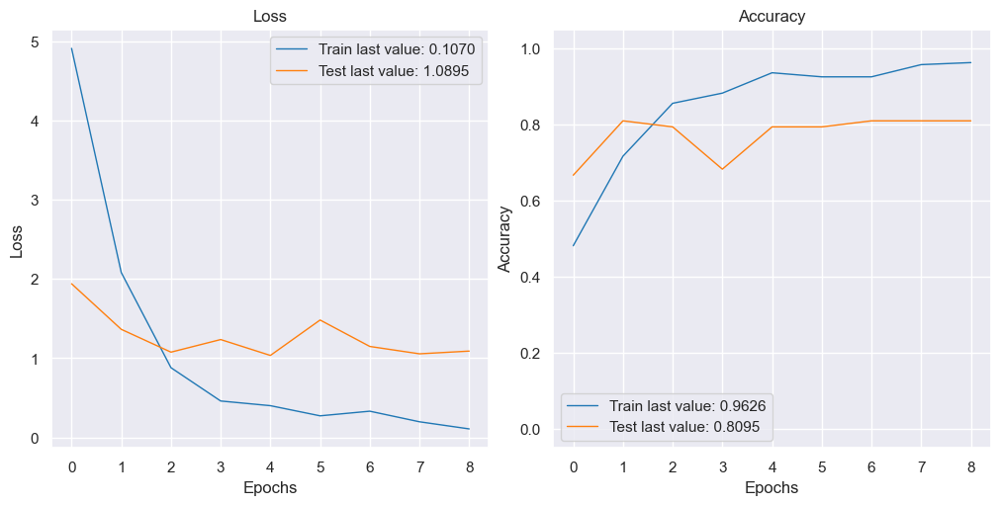

<Figure size 640x480 with 0 Axes>

In [187]:
from plot_keras_history import show_history, plot_history
import matplotlib.pyplot as plt

# Ajouter un titre général
plt.suptitle("Modèle d'entraînement supervisé avec convolution", fontsize=32)

show_history(history1)
plot_history(history1, path="standard.png")

plt.close()

# Enregistrer le graphique en tant qu'image 
plt.savefig('modele_2_supervise_convolution.png', bbox_inches='tight')

In [188]:
y_val_num = np.argmax(y_val, axis=1)
y_val_pred = np.argmax(model1.predict(X_val), axis=1)
y_val_num = np.argmax(y_val, axis=1)
print(y_val_num)
print()
print(y_val_pred)

2/2 [==============================] - 3s 2s/step
[4 1 4 3 4 0 4 0 2 2 4 1 1 3 0 2 4 3 1 3 3 4 0 0 4 4 1 3 4 2 3 1 1 2 2 0 4
 3 0 0 2 2 1 3 1 0 0 4 0 1 2 1 1 4 2 3 2 0 3 2 1 3 2]

[2 1 2 3 4 1 4 0 2 2 2 1 1 3 0 0 4 3 1 3 3 4 2 0 4 4 1 3 4 2 3 3 1 3 2 3 4
 3 4 0 2 2 1 3 1 0 0 2 0 1 2 0 1 4 2 3 4 0 3 2 1 3 2]


In [189]:
from sklearn import metrics

conf_mat = metrics.confusion_matrix(y_val_num, y_val_pred)
print(conf_mat)

[[ 8  1  1  1  1]
 [ 1 11  0  1  0]
 [ 1  0 10  1  1]
 [ 0  0  0 12  0]
 [ 0  0  4  0  9]]


In [190]:
from sklearn import metrics

y_val_pred_transform = conf_mat_transform(y_val_num, y_val_pred)
conf_mat = metrics.confusion_matrix(y_val_num, y_val_pred_transform)
print(conf_mat)
print()
print(metrics.classification_report(y_val_num, y_val_pred_transform))

Correspondance des clusters :  [0 1 2 3 4]
[[ 8  1  1  1  1]
 [ 1 11  0  1  0]
 [ 1  0 10  1  1]
 [ 0  0  0 12  0]
 [ 0  0  4  0  9]]

              precision    recall  f1-score   support

           0       0.80      0.67      0.73        12
           1       0.92      0.85      0.88        13
           2       0.67      0.77      0.71        13
           3       0.80      1.00      0.89        12
           4       0.82      0.69      0.75        13

    accuracy                           0.79        63
   macro avg       0.80      0.79      0.79        63
weighted avg       0.80      0.79      0.79        63



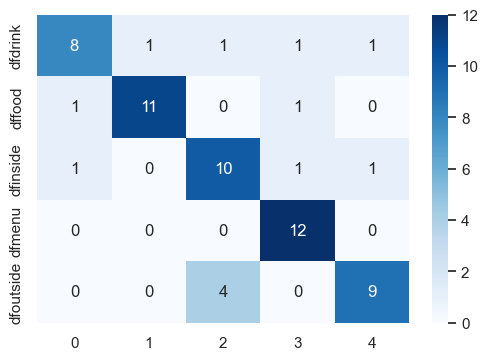

In [209]:
df_cm = pd.DataFrame(conf_mat, index = [label for label in list_labels],
                  columns = [i for i in "01234"])
plt.figure(figsize = (6,4))
sns.heatmap(df_cm, annot=True, cmap="Blues")

# Enregistrer le graphique en tant qu'image 
plt.savefig('modele_supervise_matrice_confusion.png', bbox_inches='tight')

## Approche ImageDatagenerator avec data augmentation

In [192]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [193]:
# Pour mélanger les images, classées initalement par classe
data = data.sample(frac=1, random_state=42).reset_index(drop=True)

In [194]:
batch_size = 10

def data_flow_fct(data, datagen, data_type=None) :
    data_flow = datagen.flow_from_dataframe(data, directory='',
                                x_col='image_path', y_col='label_name',
                                weight_col=None, target_size=(256, 256),
                                classes=None, class_mode='categorical',
                                batch_size=batch_size, shuffle=True, seed=42,
                                subset=data_type
                                )
    return data_flow

In [195]:
datagen_train = ImageDataGenerator(
#    featurewise_center=True,
#    featurewise_std_normalization=True,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    horizontal_flip=True,
    validation_split=0.20,
    preprocessing_function=preprocess_input)

train_flow = data_flow_fct(data, datagen_train, data_type='training')
val_flow = data_flow_fct(data, datagen_train, data_type='validation')

# compute quantities required for featurewise normalization
# (std, mean, and principal components if ZCA whitening is applied)
# datagen.fit(X_train)
# fits the model on batches with real-time data augmentation:

Found 200 validated image filenames belonging to 5 classes.
Found 50 validated image filenames belonging to 5 classes.


In [196]:
# Création du modèle
with tf.device('/gpu:0'):
    model2 = create_model_fct()

# Création du callback
model2_save_path = "./model2_best_weights.h5"
checkpoint = ModelCheckpoint(model2_save_path, monitor='val_loss', verbose=1, save_best_only=True, mode='min')
es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=5)
callbacks_list = [checkpoint, es]

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\random.py:370: DeprecationWarning: non-integer arguments to randrange() have been deprecated since Python 3.10 and will be removed in a subsequent version
  return self.randrange(a, b+1)
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\random.py:370: DeprecationWarning: non-integer arguments to randrange() have been deprecated since Python 3.10 and will be removed in a subsequent version
  return self.randrange(a, b+1)
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\random.py:370: DeprecationWarning: non-integer arguments to randrange() have been deprecated since Python 3.10 and will be removed in a subsequent version
  return self.randrange(a, b+1)
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\random.py:370: DeprecationWarning: non-integer arguments to randrange() have been deprecated since Python 3.10 and will be removed in a subsequent version
  return self.randrange(a, b+1)
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\random.

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0   

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\random.py:370: DeprecationWarning: non-integer arguments to randrange() have been deprecated since Python 3.10 and will be removed in a subsequent version
  return self.randrange(a, b+1)
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\random.py:370: DeprecationWarning: non-integer arguments to randrange() have been deprecated since Python 3.10 and will be removed in a subsequent version
  return self.randrange(a, b+1)


In [197]:
print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))


Num GPUs Available:  0


In [211]:
with tf.device('/gpu:0'):
    history2 = model2.fit(train_flow,
                    validation_data=val_flow,
                    batch_size=batch_size, epochs=20, callbacks=callbacks_list, verbose=1)


C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

Epoch 1/20


C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

 1/20 [>.............................] - ETA: 19s - loss: 1.6489 - accuracy: 0.6000

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

 2/20 [==>...........................] - ETA: 12s - loss: 2.2792 - accuracy: 0.5500

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

 3/20 [===>..........................] - ETA: 11s - loss: 2.2570 - accuracy: 0.5333

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

 4/20 [=====>........................] - ETA: 11s - loss: 2.7107 - accuracy: 0.6000

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

 5/20 [======>.......................] - ETA: 10s - loss: 2.4520 - accuracy: 0.6400

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

 6/20 [========>.....................] - ETA: 9s - loss: 2.2362 - accuracy: 0.6500 

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

 7/20 [=========>....................] - ETA: 8s - loss: 2.0674 - accuracy: 0.6429

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

 8/20 [===========>..................] - ETA: 8s - loss: 2.1701 - accuracy: 0.6375

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

 9/20 [============>.................] - ETA: 7s - loss: 2.2071 - accuracy: 0.6556

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

10/20 [==============>...............] - ETA: 6s - loss: 2.2306 - accuracy: 0.6600

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

11/20 [===============>..............] - ETA: 6s - loss: 2.1757 - accuracy: 0.6636

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

12/20 [=================>............] - ETA: 5s - loss: 2.1669 - accuracy: 0.6500

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

13/20 [==================>...........] - ETA: 4s - loss: 2.0912 - accuracy: 0.6615

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

14/20 [====================>.........] - ETA: 4s - loss: 2.2267 - accuracy: 0.6500

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

15/20 [=====================>........] - ETA: 3s - loss: 2.2475 - accuracy: 0.6533

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

16/20 [=======================>......] - ETA: 2s - loss: 2.4471 - accuracy: 0.6313

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

17/20 [========================>.....] - ETA: 2s - loss: 2.3525 - accuracy: 0.6412

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

18/20 [==========================>...] - ETA: 1s - loss: 2.3483 - accuracy: 0.6500

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

20/20 [==============================] - ETA: 0s - loss: 2.4641 - accuracy: 0.6450

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor


Epoch 1: val_loss did not improve from 0.97173
20/20 [==============================] - 18s 906ms/step - loss: 2.4641 - accuracy: 0.6450 - val_loss: 1.5375 - val_accuracy: 0.8000
Epoch 2/20


C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

 1/20 [>.............................] - ETA: 15s - loss: 0.0507 - accuracy: 1.0000

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

 2/20 [==>...........................] - ETA: 12s - loss: 0.5182 - accuracy: 0.8500

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

 3/20 [===>..........................] - ETA: 11s - loss: 0.8343 - accuracy: 0.7667

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

 4/20 [=====>........................] - ETA: 11s - loss: 0.6284 - accuracy: 0.8250

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

 5/20 [======>.......................] - ETA: 10s - loss: 0.6087 - accuracy: 0.8000

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

 6/20 [========>.....................] - ETA: 9s - loss: 0.8586 - accuracy: 0.7833 

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

 7/20 [=========>....................] - ETA: 9s - loss: 0.8528 - accuracy: 0.8000

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

 8/20 [===========>..................] - ETA: 8s - loss: 0.7619 - accuracy: 0.8125

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

 9/20 [============>.................] - ETA: 7s - loss: 0.9205 - accuracy: 0.8111

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

10/20 [==============>...............] - ETA: 7s - loss: 1.0663 - accuracy: 0.8000

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

11/20 [===============>..............] - ETA: 6s - loss: 0.9849 - accuracy: 0.8091

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

12/20 [=================>............] - ETA: 5s - loss: 0.9265 - accuracy: 0.8167

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

13/20 [==================>...........] - ETA: 4s - loss: 0.9407 - accuracy: 0.8154

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

14/20 [====================>.........] - ETA: 4s - loss: 0.9582 - accuracy: 0.8071

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

15/20 [=====================>........] - ETA: 3s - loss: 0.9748 - accuracy: 0.8000

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

16/20 [=======================>......] - ETA: 2s - loss: 0.9147 - accuracy: 0.8125

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

17/20 [========================>.....] - ETA: 2s - loss: 0.9669 - accuracy: 0.8059

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

18/20 [==========================>...] - ETA: 1s - loss: 0.9208 - accuracy: 0.8111

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

20/20 [==============================] - ETA: 0s - loss: 0.9264 - accuracy: 0.8100

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor


Epoch 2: val_loss improved from 0.97173 to 0.89992, saving model to .\model2_best_weights.h5
20/20 [==============================] - 18s 894ms/step - loss: 0.9264 - accuracy: 0.8100 - val_loss: 0.8999 - val_accuracy: 0.8400
Epoch 3/20


C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

 1/20 [>.............................] - ETA: 15s - loss: 0.0538 - accuracy: 1.0000

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

 2/20 [==>...........................] - ETA: 12s - loss: 0.1573 - accuracy: 0.9500

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

 3/20 [===>..........................] - ETA: 11s - loss: 0.1762 - accuracy: 0.9333

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

 4/20 [=====>........................] - ETA: 11s - loss: 0.2587 - accuracy: 0.9000

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

 5/20 [======>.......................] - ETA: 10s - loss: 0.3046 - accuracy: 0.9000

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

 6/20 [========>.....................] - ETA: 9s - loss: 0.3110 - accuracy: 0.9000 

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

 7/20 [=========>....................] - ETA: 9s - loss: 0.2920 - accuracy: 0.9000

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

 8/20 [===========>..................] - ETA: 8s - loss: 0.2802 - accuracy: 0.9000

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

 9/20 [============>.................] - ETA: 7s - loss: 0.4505 - accuracy: 0.8778

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

10/20 [==============>...............] - ETA: 7s - loss: 0.4624 - accuracy: 0.8800

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

11/20 [===============>..............] - ETA: 6s - loss: 0.4595 - accuracy: 0.8727

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

12/20 [=================>............] - ETA: 5s - loss: 0.5341 - accuracy: 0.8750

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

13/20 [==================>...........] - ETA: 4s - loss: 0.5074 - accuracy: 0.8769

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

14/20 [====================>.........] - ETA: 4s - loss: 0.5615 - accuracy: 0.8643

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

15/20 [=====================>........] - ETA: 3s - loss: 0.5295 - accuracy: 0.8733

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

16/20 [=======================>......] - ETA: 2s - loss: 0.5523 - accuracy: 0.8687

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

17/20 [========================>.....] - ETA: 2s - loss: 0.5370 - accuracy: 0.8706

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

18/20 [==========================>...] - ETA: 1s - loss: 0.5103 - accuracy: 0.8778

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

20/20 [==============================] - ETA: 0s - loss: 0.4661 - accuracy: 0.8850

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor


Epoch 3: val_loss did not improve from 0.89992
20/20 [==============================] - 18s 878ms/step - loss: 0.4661 - accuracy: 0.8850 - val_loss: 1.0211 - val_accuracy: 0.8200
Epoch 4/20


C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

 1/20 [>.............................] - ETA: 15s - loss: 0.5467 - accuracy: 0.9000

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

 2/20 [==>...........................] - ETA: 12s - loss: 0.3446 - accuracy: 0.9000

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

 3/20 [===>..........................] - ETA: 12s - loss: 0.5278 - accuracy: 0.8667

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

 4/20 [=====>........................] - ETA: 11s - loss: 0.4079 - accuracy: 0.9000

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

 5/20 [======>.......................] - ETA: 10s - loss: 0.3354 - accuracy: 0.9200

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

 6/20 [========>.....................] - ETA: 10s - loss: 0.3253 - accuracy: 0.9000

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

 7/20 [=========>....................] - ETA: 9s - loss: 0.3271 - accuracy: 0.8857 

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

 8/20 [===========>..................] - ETA: 8s - loss: 0.4109 - accuracy: 0.8750

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

 9/20 [============>.................] - ETA: 8s - loss: 0.3837 - accuracy: 0.8889

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

10/20 [==============>...............] - ETA: 7s - loss: 0.4578 - accuracy: 0.8800

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

11/20 [===============>..............] - ETA: 6s - loss: 0.5349 - accuracy: 0.8727

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

12/20 [=================>............] - ETA: 5s - loss: 0.5063 - accuracy: 0.8750

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

13/20 [==================>...........] - ETA: 5s - loss: 0.4677 - accuracy: 0.8846

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

14/20 [====================>.........] - ETA: 4s - loss: 0.4681 - accuracy: 0.8857

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

15/20 [=====================>........] - ETA: 3s - loss: 0.4750 - accuracy: 0.8867

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

16/20 [=======================>......] - ETA: 2s - loss: 0.4952 - accuracy: 0.8813

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

17/20 [========================>.....] - ETA: 2s - loss: 0.5291 - accuracy: 0.8765

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

18/20 [==========================>...] - ETA: 1s - loss: 0.5047 - accuracy: 0.8833

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

20/20 [==============================] - ETA: 0s - loss: 0.5109 - accuracy: 0.8900

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor


Epoch 4: val_loss did not improve from 0.89992
20/20 [==============================] - 19s 956ms/step - loss: 0.5109 - accuracy: 0.8900 - val_loss: 0.9518 - val_accuracy: 0.8200
Epoch 5/20


C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

 1/20 [>.............................] - ETA: 21s - loss: 0.2520 - accuracy: 0.9000

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

 2/20 [==>...........................] - ETA: 13s - loss: 1.0773 - accuracy: 0.8000

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

 3/20 [===>..........................] - ETA: 12s - loss: 0.7848 - accuracy: 0.8333

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

 4/20 [=====>........................] - ETA: 11s - loss: 0.6463 - accuracy: 0.8500

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

 5/20 [======>.......................] - ETA: 11s - loss: 0.5937 - accuracy: 0.8600

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

 6/20 [========>.....................] - ETA: 10s - loss: 0.5396 - accuracy: 0.8667

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

 7/20 [=========>....................] - ETA: 9s - loss: 0.4790 - accuracy: 0.8714 

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

 8/20 [===========>..................] - ETA: 8s - loss: 0.4284 - accuracy: 0.8875

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

 9/20 [============>.................] - ETA: 8s - loss: 0.4823 - accuracy: 0.8889

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

10/20 [==============>...............] - ETA: 7s - loss: 0.6222 - accuracy: 0.8700

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

11/20 [===============>..............] - ETA: 6s - loss: 0.5765 - accuracy: 0.8727

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

12/20 [=================>............] - ETA: 5s - loss: 0.5726 - accuracy: 0.8667

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

13/20 [==================>...........] - ETA: 5s - loss: 0.6338 - accuracy: 0.8692

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

14/20 [====================>.........] - ETA: 4s - loss: 0.6516 - accuracy: 0.8571

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

15/20 [=====================>........] - ETA: 3s - loss: 0.6140 - accuracy: 0.8600

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

16/20 [=======================>......] - ETA: 2s - loss: 0.6421 - accuracy: 0.8562

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

17/20 [========================>.....] - ETA: 2s - loss: 0.6294 - accuracy: 0.8588

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

18/20 [==========================>...] - ETA: 1s - loss: 0.6036 - accuracy: 0.8611

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

20/20 [==============================] - ETA: 0s - loss: 0.5727 - accuracy: 0.8650

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor


Epoch 5: val_loss did not improve from 0.89992
20/20 [==============================] - 18s 905ms/step - loss: 0.5727 - accuracy: 0.8650 - val_loss: 1.5059 - val_accuracy: 0.7800
Epoch 6/20


C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

 1/20 [>.............................] - ETA: 15s - loss: 0.8439 - accuracy: 0.8000

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

 2/20 [==>...........................] - ETA: 12s - loss: 1.0770 - accuracy: 0.8000

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

 3/20 [===>..........................] - ETA: 11s - loss: 0.7574 - accuracy: 0.8333

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

 4/20 [=====>........................] - ETA: 11s - loss: 0.5746 - accuracy: 0.8750

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

 5/20 [======>.......................] - ETA: 10s - loss: 0.5974 - accuracy: 0.8600

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

 6/20 [========>.....................] - ETA: 9s - loss: 0.6423 - accuracy: 0.8667 

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

 7/20 [=========>....................] - ETA: 9s - loss: 0.5559 - accuracy: 0.8857

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

 8/20 [===========>..................] - ETA: 8s - loss: 0.5008 - accuracy: 0.9000

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

 9/20 [============>.................] - ETA: 7s - loss: 0.5537 - accuracy: 0.8889

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

10/20 [==============>...............] - ETA: 7s - loss: 0.6085 - accuracy: 0.8900

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

11/20 [===============>..............] - ETA: 6s - loss: 0.5538 - accuracy: 0.9000

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

12/20 [=================>............] - ETA: 5s - loss: 0.5131 - accuracy: 0.9083

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

13/20 [==================>...........] - ETA: 4s - loss: 0.4813 - accuracy: 0.9154

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

14/20 [====================>.........] - ETA: 4s - loss: 0.4584 - accuracy: 0.9143

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

15/20 [=====================>........] - ETA: 3s - loss: 0.4545 - accuracy: 0.9133

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

16/20 [=======================>......] - ETA: 2s - loss: 0.4665 - accuracy: 0.9125

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

17/20 [========================>.....] - ETA: 2s - loss: 0.4592 - accuracy: 0.9118

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

18/20 [==========================>...] - ETA: 1s - loss: 0.4959 - accuracy: 0.9056

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

20/20 [==============================] - ETA: 0s - loss: 0.4691 - accuracy: 0.9100

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor


Epoch 6: val_loss did not improve from 0.89992
20/20 [==============================] - 19s 960ms/step - loss: 0.4691 - accuracy: 0.9100 - val_loss: 1.2833 - val_accuracy: 0.8200
Epoch 7/20


C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

 1/20 [>.............................] - ETA: 18s - loss: 0.0022 - accuracy: 1.0000

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

 2/20 [==>...........................] - ETA: 13s - loss: 0.1026 - accuracy: 0.9500

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

 3/20 [===>..........................] - ETA: 12s - loss: 0.0699 - accuracy: 0.9667

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

 4/20 [=====>........................] - ETA: 11s - loss: 0.1605 - accuracy: 0.9250

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

 5/20 [======>.......................] - ETA: 10s - loss: 0.1534 - accuracy: 0.9400

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

 6/20 [========>.....................] - ETA: 9s - loss: 0.1281 - accuracy: 0.9500 

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

 7/20 [=========>....................] - ETA: 9s - loss: 0.1098 - accuracy: 0.9571

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

 8/20 [===========>..................] - ETA: 8s - loss: 0.2289 - accuracy: 0.9500

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

 9/20 [============>.................] - ETA: 7s - loss: 0.2073 - accuracy: 0.9556

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

10/20 [==============>...............] - ETA: 7s - loss: 0.2153 - accuracy: 0.9500

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

11/20 [===============>..............] - ETA: 6s - loss: 0.2451 - accuracy: 0.9455

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

12/20 [=================>............] - ETA: 5s - loss: 0.2276 - accuracy: 0.9500

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

13/20 [==================>...........] - ETA: 5s - loss: 0.2246 - accuracy: 0.9462

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

14/20 [====================>.........] - ETA: 4s - loss: 0.3843 - accuracy: 0.9214

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

15/20 [=====================>........] - ETA: 3s - loss: 0.3601 - accuracy: 0.9267

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

16/20 [=======================>......] - ETA: 2s - loss: 0.3384 - accuracy: 0.9312

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

17/20 [========================>.....] - ETA: 2s - loss: 0.3202 - accuracy: 0.9353

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

18/20 [==========================>...] - ETA: 1s - loss: 0.3383 - accuracy: 0.9278

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

20/20 [==============================] - ETA: 0s - loss: 0.3581 - accuracy: 0.9200

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor


Epoch 7: val_loss did not improve from 0.89992
20/20 [==============================] - 19s 940ms/step - loss: 0.3581 - accuracy: 0.9200 - val_loss: 1.1939 - val_accuracy: 0.8200
Epoch 7: early stopping


In [199]:
# Score du dernier epoch

loss, accuracy = model2.evaluate(train_flow, verbose=True)
print("Training Accuracy   : {:.4f}".format(accuracy))
print()
loss, accuracy = model2.evaluate(val_flow, verbose=True)
print("Validation Accuracy :  {:.4f}".format(accuracy))

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

 1/20 [>.............................] - ETA: 15s - loss: 0.0129 - accuracy: 1.0000

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

 2/20 [==>...........................] - ETA: 12s - loss: 0.0245 - accuracy: 1.0000

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

 3/20 [===>..........................] - ETA: 11s - loss: 0.0475 - accuracy: 0.9667

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

 4/20 [=====>........................] - ETA: 11s - loss: 0.0370 - accuracy: 0.9750

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

 5/20 [======>.......................] - ETA: 10s - loss: 0.0342 - accuracy: 0.9800

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

 6/20 [========>.....................] - ETA: 9s - loss: 0.1026 - accuracy: 0.9500 

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

 7/20 [=========>....................] - ETA: 8s - loss: 0.0886 - accuracy: 0.9571

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

 8/20 [===========>..................] - ETA: 8s - loss: 0.0779 - accuracy: 0.9625

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

 9/20 [============>.................] - ETA: 7s - loss: 0.0964 - accuracy: 0.9556

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

10/20 [==============>...............] - ETA: 6s - loss: 0.1209 - accuracy: 0.9500

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

11/20 [===============>..............] - ETA: 6s - loss: 0.1151 - accuracy: 0.9545

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

12/20 [=================>............] - ETA: 5s - loss: 0.1916 - accuracy: 0.9500

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

13/20 [==================>...........] - ETA: 4s - loss: 0.1811 - accuracy: 0.9538

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

14/20 [====================>.........] - ETA: 4s - loss: 0.1682 - accuracy: 0.9571

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

15/20 [=====================>........] - ETA: 3s - loss: 0.1606 - accuracy: 0.9600

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

16/20 [=======================>......] - ETA: 2s - loss: 0.1507 - accuracy: 0.9625

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

17/20 [========================>.....] - ETA: 2s - loss: 0.1454 - accuracy: 0.9647

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

18/20 [==========================>...] - ETA: 1s - loss: 0.1377 - accuracy: 0.9667

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

20/20 [==============================] - 14s 688ms/step - loss: 0.1404 - accuracy: 0.9650
Training Accuracy   : 0.9650



C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

1/5 [=====>........................] - ETA: 3s - loss: 0.2166 - accuracy: 0.9000

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

2/5 [===========>..................] - ETA: 1s - loss: 0.6982 - accuracy: 0.7500

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

3/5 [=================>............] - ETA: 1s - loss: 0.6473 - accuracy: 0.7333

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

5/5 [==============================] - 3s 667ms/step - loss: 1.3048 - accuracy: 0.7400
Validation Accuracy :  0.7400


In [200]:
# Score de l'epoch optimal

model2.load_weights(model2_save_path)

loss, accuracy = model2.evaluate(val_flow, verbose=False)
print("Validation Accuracy :  {:.4f}".format(accuracy))

C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  ndimage.interpolation.affine_transform(
C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\keras\preprocessing\image.py:2616: DeprecationWarning: Please use `affine_transfor

Validation Accuracy :  0.8200


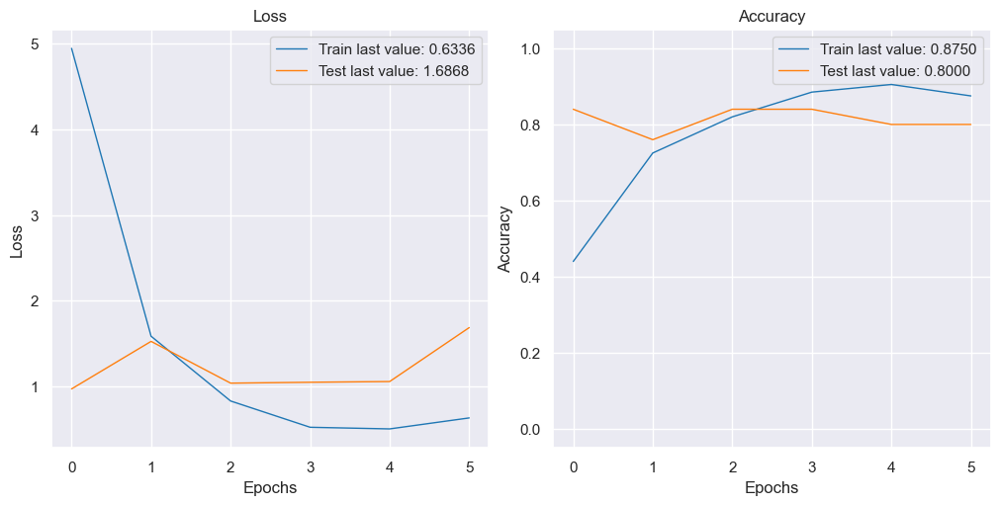

<Figure size 640x480 with 0 Axes>

In [210]:
from plot_keras_history import show_history, plot_history
import matplotlib.pyplot as plt

show_history(history2)
plot_history(history2, path="standard.png")
plt.close()

# Enregistrer le graphique en tant qu'image 
plt.savefig('modele_supervise_avec_datageneration.png', bbox_inches='tight')

# Récupération des données d'autres restaurants à partir de Yelp

In [202]:
! pip install requests

In [203]:
! pip install yelpapi

Approche 1. Restaurants à Paris

Dans cette récupération nous avons souhaité récupérer tous les restaurants disponibles sur yelp à Paris au moment de la requête.


In [204]:
import csv
from yelpapi import YelpAPI
import pprint

# clé API Yelp réelle
api_key = '-HctTi4HnHWi6NyIas9_zr32gtI1vttDRLRDEEGiczGG_AahVjgWsYRqKICbUJ8Ss_Jn4_GDcwm1wVDwOGN-HG0OCWHYPkJ7L4aU3WawpsSDTb1PUu9JXxVeBNRqZXYx'

# Fonction pour rechercher des restaurants à Paris avec pagination et sauvegarder dans un fichier CSV
def rechercher_restaurants(api_key, total_results=200, csv_filename='restaurants.csv'):
    with YelpAPI(api_key) as yelp_api:
        offset = 0
        limit = 50
        results = []

        while offset < total_results:
            # Recherche de restaurants à Paris avec pagination
            reponse = yelp_api.search_query(term='restaurants', location='Paris', limit=limit, offset=offset)

            # Ajouter les résultats actuels à la liste des résultats
            results.extend(reponse['businesses'])

            # Mettre à jour l'offset pour la prochaine itération
            offset += limit

        # Sauvegarder les résultats dans un fichier CSV
        with open(csv_filename, 'w', newline='', encoding='utf-8') as csvfile:
            fieldnames = ['id', 'name', 'rating', 'review_count', 'address']
            writer = csv.DictWriter(csvfile, fieldnames=fieldnames)

            # Écrire l'en-tête CSV
            writer.writeheader()

            # Écrire chaque ligne de données dans le fichier CSV
            for business in results:
                writer.writerow({
                    'id': business['id'],
                    'name': business['name'],
                    'rating': business['rating'],
                    'review_count': business['review_count'],
                    'address': ', '.join(business['location']['display_address'])
                })

# Appeler la fonction avec la clé API
rechercher_restaurants(api_key, total_results=200)


In [205]:
import pandas as pd

df_restaurants = pd.read_csv("restaurants.csv")
df_restaurants.head()


,id,name,rating,review_count,address
0,-0iLH7iQNYtoURciDpJf6w,Le Comptoir de la Gastronomie,4.5,1292,"34 rue Montmartre, 75001 Paris, France"
1,IU9_wVOGBKjfqTTpAXpKcQ,Bistro des Augustins,4.5,483,"39 quai des Grands Augustins, 75006 Paris, France"
2,70xArgLO0k56YAytyBIHyg,Baguett's Café,4.5,237,"33 rue de Richelieu, 75001 Paris, France"
3,cEjF41ZQB8-SST8cd3EsEw,L'Avant Comptoir,4.5,656,"3 carrefour de l'Odéon, 75006 Paris, France"
4,ctP4c3mwVO5oOzLI48LtuQ,Les Antiquaires,4.5,465,"13 rue du Bac, 75007 Paris, France"


In [206]:
df_restaurants.shape

(200, 5)

# Voilà pour publication des résultats

In [207]:
import os

notebook_path = ('')
absolute_path = os.path.abspath(notebook_path)

!voila {absolute_path}


Traceback (most recent call last):
  File "C:\Users\andre\anaconda3\envs\P6_texte_image\Scripts\voila-script.py", line 10, in <module>
    sys.exit(main())
  File "C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\traitlets\config\application.py", line 991, in launch_instance
    app.initialize(argv)
  File "C:\Users\andre\anaconda3\envs\P6_texte_image\lib\site-packages\voila\app.py", line 532, in initialize
    raise ValueError("provided more than 1 argument: %r" % self.extra_args)
ValueError: provided more than 1 argument: ['C:\\Users\\andre\\OC', 'Projets\\P6', '-', 'NLP']
